<a href="https://colab.research.google.com/github/SahilGadge/Kaggle-Cat-in-the-dat-Challenge/blob/main/Cat_in_the_Dat_Kaggle.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Kaggle**

# 1.   Name : Sahil Sanjay Gadge.





---



### Competition : Categorical Feature Encoding Challenge (https://www.kaggle.com/c/cat-in-the-dat/overview)




---



## **Abstract**



> #### **The goal of this notebook is to solve classification problems using various algorithms and compare their accuracy. For, this comparison I used various algorithms from Scikit-Learn and H2O autoML. Also, before applying such models I also performed Feature Selection and Engineering on the data. I successfully trained and explained various models to compare their prediction accuracy for classifiaction problem.**





---



This dataset contains following Attributes.

1. id - Unique number for every row
2. bin_0 - Binary Feature with **0 and 1**
3. bin_1 - Binary Feature with **0 and 1**
4. bin_2 - Binary Feature with **0 and 1**
5. bin_3 - Binary Feature with **T and F**
6. bin_4 - Binary Feature with **Y and N**
7. nom_0 - Nominal Feature with **3** unique values
8. nom_1 - Nominal Feature with **6** unique values
9. nom_2 - Nominal Feature with **6** unique values
10. nom_3 - Nominal Feature with **6** unique values
11. nom_4 - Nominal Feature with **4** unique values
12. nom_5 - Nominal Feature with **222** unique values
13. nom_6 - Nominal Feature with **522** unique values
14. nom_7 - Nominal Feature with **1220** unique values
15. nom_8 - Nominal Feature with **2215** unique values
16. nom_8 - Nominal Feature with **11981** unique values
17. ord_0 - Ordinal Feature with **3** unique values
18. ord_1 - Ordinal Feature with **5** unique values
19. ord_2 - Ordinal Feature with **6** unique values
20. ord_3 - Ordinal Feature with **15** unique values
21. ord_4 - Ordinal Feature with **26** unique values
22. ord_5 - Ordinal Feature with 192 unique values
23. day - Day in the month 
24. month - Month Number 
25. target - Dependent Variable have 1 and 0 values



---


## **1. Importing Data**

The size of training data set was 40 MB, but github only accept file with size less than 25 MB. Therefore, we split data set in three csv files and import. After importing combining them will give us our orignal training set.

In [ ]:
import pandas as pd

#import 3 splitted CSV files of training dataset
df = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-1.csv")
df1 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-2.csv")
df2 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-3.csv")
#Combine these 3 dataframes to get our dataset
dftrain = pd.concat([df, df1,df2]) 

#importing testing dataset
dftest = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/test.csv")



---



## **2. Data Checking**

In [ ]:
#Checking shape of train and test data 
print("Training Dataset have ",dftrain.shape[0]," Rows and", dftrain.shape[1]," Coloums")
print("Test Dataset have ",dftest.shape[0]," Rows and", dftest.shape[1]," Coloums")

Training Dataset have  300000  Rows and 25  Coloums
Test Dataset have  200000  Rows and 24  Coloums




---


> Concatinate both train and test dataset together for further analysis train rows + test rows = 500000






In [ ]:
#Check for null values
df = pd.concat([dftrain.drop('target', axis = 1), dftest]) #Concatinating two dataframes. Here we are droping target coloumn because test set does not contain target.
df.info() # Check for null values in data

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500000 entries, 0 to 199999
Data columns (total 24 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   id      500000 non-null  int64 
 1   bin_0   500000 non-null  int64 
 2   bin_1   500000 non-null  int64 
 3   bin_2   500000 non-null  int64 
 4   bin_3   500000 non-null  object
 5   bin_4   500000 non-null  object
 6   nom_0   500000 non-null  object
 7   nom_1   500000 non-null  object
 8   nom_2   500000 non-null  object
 9   nom_3   500000 non-null  object
 10  nom_4   500000 non-null  object
 11  nom_5   500000 non-null  object
 12  nom_6   500000 non-null  object
 13  nom_7   500000 non-null  object
 14  nom_8   500000 non-null  object
 15  nom_9   500000 non-null  object
 16  ord_0   500000 non-null  int64 
 17  ord_1   500000 non-null  object
 18  ord_2   500000 non-null  object
 19  ord_3   500000 non-null  object
 20  ord_4   500000 non-null  object
 21  ord_5   500000 non-null  object
 



---




> Checking how much unique values each categorical variables have



In [ ]:
df.nunique()

id            500000
bin_0              2
bin_1              2
bin_2              2
bin_3              2
bin_4              2
ord_0              3
ord_1              5
ord_2              6
ord_3             15
ord_4             26
ord_5            192
nom_0_targ         3
nom_1_targ         6
nom_2_targ         6
nom_3_targ         6
nom_4_targ         4
nom_5_targ       222
nom_6_targ       511
nom_7_targ      1050
nom_8_targ      1510
nom_9_targ       822
day_targ           7
month_targ        12
dtype: int64

From this output we can see that ord_5, nom_5, nom_6, nom_7, nom_8, nom_9 have more than 100 unique categories.



---




> Plotting Binary and Ordinal Features



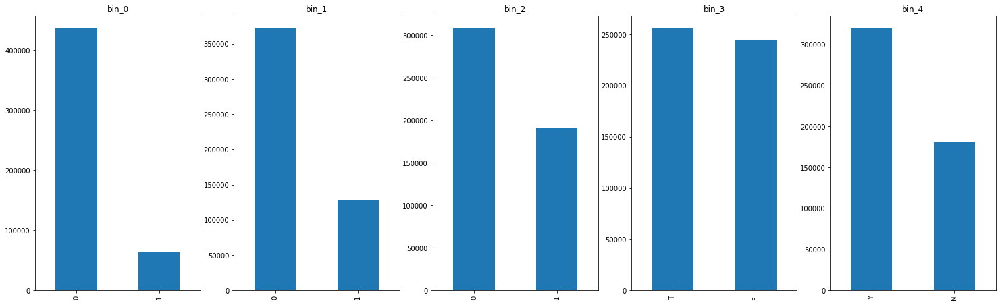

In [ ]:
import matplotlib.pyplot as plt


categorical_features = ['bin_' + str(i) for i in range(5)]
fig, ax = plt.subplots(1, len(categorical_features))
for i, categorical_feature in enumerate(df[categorical_features]):
    df[categorical_feature].value_counts().plot(kind="bar", ax=ax[i]).set_title(categorical_feature)
fig.set_size_inches(25.5, 7.5)
fig.show()

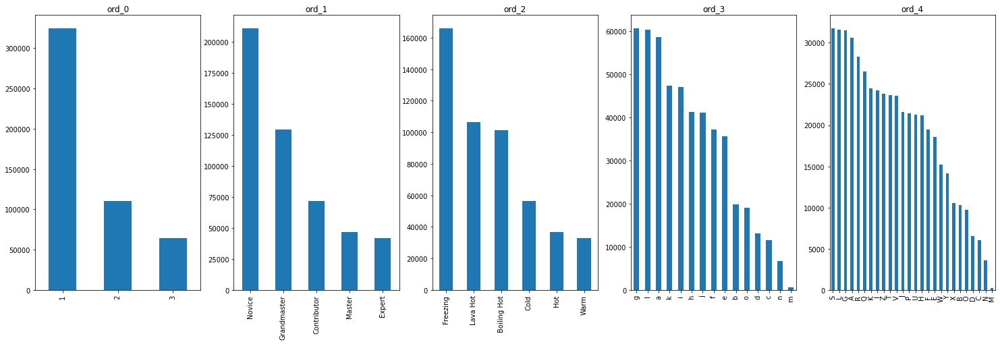

In [ ]:
import matplotlib.pyplot as plt


categorical_features = ['ord_' + str(i) for i in range(5)]
fig, ax = plt.subplots(1, len(categorical_features))
for i, categorical_feature in enumerate(df[categorical_features]):
    df[categorical_feature].value_counts().plot(kind="bar", ax=ax[i]).set_title(categorical_feature)
fig.set_size_inches(25.5, 7.5)
fig.show()



---


> From checks above it is clear that data does not contain any missing values and Data set contains only catagorical variables of different types like Binary, Ordinal and Nominal. Also, from plots we can see that binomial and ordinal variables are well distributed. And to further perform operation on them we need to encode them in appropriate format.


---








## **3. Feature Engineering**

### **3.1 Binary Feature Encoding**



> Binary features like "bin_0", "bin_1", "bin_2" are already in 0/1 format. However, features like "bin_3" and "bin_4" are in T/F and Y/N format and we need to convert them in 0/1 format.



In [ ]:
binvar = ['bin_' + str(i) for i in range(5)] # Assigning binvar list to all binary feature names in dataset
ordvar = ['ord_' + str(i) for i in range(6)] # Assigning ordvar list to all ordinal feature names in dataset

In [ ]:
# For bin_3 feature, mapping F to 0 and T to 1.
df['bin_3'] = df['bin_3'].map({'F':0, 'T':1})

# For bin_4 feature, mapping N to 0 and Y to 1.
df['bin_4'] = df['bin_4'].map({'N':0, 'Y':1})

df[binvar].head()

,bin_0,bin_1,bin_2,bin_3,bin_4
0,0,0,0,1,1
1,0,1,0,1,1
2,0,0,0,0,1
3,0,1,0,0,1
4,0,0,0,0,0


In [ ]:
#Dropping "id", "bin_0" because they do not contribute in prediction of target variable. Please scroll down to see OLS for proof
df.drop(df[['id','bin_0']], inplace=True, axis=1)

### **3.2 Ordinal Feature Encoding**


> For ordinal variables like "ord_1" and "ord_2" we will map coloumn using appropriate ranking to each category.

In [ ]:
# "ord_1" = mapping according to the order of the categories
ord1dict = {'Novice':0, 'Contributor':1, 'Expert':2, 'Master':3, 'Grandmaster':4}
df['ord_1'] = df['ord_1'].map(ord1dict)

# "ord_2" = mapping according to the order of the categories
ord2dict = {'Freezing':0, 'Cold':1, 'Warm':2, 'Hot':3, 'Boiling Hot':4, 'Lava Hot':5}
df['ord_2'] = df['ord_2'].map(ord2dict)

# "ord_0" have 3,2 and 1 as a category so subtracting 1 will give us categories as 2,1,0.
df['ord_0'] = df['ord_0'] - 1



> Remaning ordinal variables can be auto encoded using Ordinal encoder



In [ ]:
df[ordvar[3:]]

,ord_3,ord_4,ord_5
0,h,D,kr
1,a,A,bF
2,h,R,Jc
3,i,D,kW
4,a,R,qP
...,...,...,...
135639,f,P,mb
135640,b,I,wu
135641,e,U,PQ
135642,i,I,rp


In [ ]:
from sklearn.preprocessing import OrdinalEncoder #import Ordinal Encoder

oe = OrdinalEncoder(categories='auto') # It will assign categories automatically according to the order
df[ordvar[3:]] = oe.fit_transform(df[ordvar[3:]]) # In our case categories are alphabetic so it will assign accordingly e.g a,b,c will become 0,1,2

In [ ]:
df[ordvar].head()

,ord_0,ord_1,ord_2,ord_3,ord_4,ord_5
0,1,4,1,7.0,3.0,136.0
1,0,4,3,0.0,0.0,93.0
2,0,2,5,7.0,17.0,31.0
3,0,4,4,8.0,3.0,134.0
4,0,4,0,0.0,17.0,158.0




> Scaling ordinal variables in the range of -1 to 1. By doing this all ordinal features will have equal weight in the model.



In [ ]:
from sklearn.preprocessing import StandardScaler
df[ordvar] = StandardScaler().fit_transform(df[ordvar])

### **3.3 Nominal Feature Encoding**

In [ ]:
nomvar = ['nom_' + str(i) for i in range(10)] # Assigning nomvar list to all nominal feature names in dataset
dmvar  = ['day', 'month'] # Assigning dmvar list to all date, month feature in dataset
binvar = ['bin_' + str(i) for i in range(5)] # Assigning binvar list to all binary feature names in dataset
ordvar = ['ord_' + str(i) for i in range(6)] # Assigning ordvar list to all ordinal feature names in dataset

There are several techniqes to encode nominal data. In our case data have high cardinality. Therefor, we can use One Hot encoding and Target Encoding but both encodings have there advantages and disadvantages. One Hot Encoding will create column for each unique value in column and that will result in huge data. And Target encoding will overfit the model.

https://medium.com/analytics-vidhya/target-encoding-vs-one-hot-encoding-with-simple-examples-276a7e7b3e64



---


####**3.3.1 One Hot Encoding**



> In One hot encoding every unique value in the nominal feature will have new column. And that will increase number of column in the dataset. In our case some nominal features have more than 100 different categories in one column. Therefore it will create data that can't be handled by pandas dataframe therefore here we are using Sparce matrix to store such huge data.



In [ ]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(categories = 'auto', dtype = 'float64', drop = 'first') #Encoding will automatically find categories and datatype of output coloumn will be float
nom_matrix = enc.fit_transform(df[nomvar]) #Encoding nominal features and storing in Sparce matrix
df.drop(nomvar, inplace=True, axis=1) #Dropping nominal features from main dataframe



> Treating date and month as nominal categorical data and appling one hot encoding and storing the data in Sparce Matrix.



In [ ]:
enc = OneHotEncoder(categories='auto', dtype = 'float64', drop = 'first') 
dm_matrix = enc.fit_transform(df[dmvar])
df.drop(dmvar, inplace=True, axis=1)



> Combining all coloums back together in sparce matrix



In [ ]:
import scipy
df_work_sprs =scipy.sparse.hstack([nom_matrix,
                                   scipy.sparse.coo_matrix(df).astype('float64'), dm_matrix
                                   ]).tocsr()
display(df_work_sprs)

<500000x16295 sparse matrix of type '<class 'numpy.float64'>'
	with 9799133 stored elements in Compressed Sparse Row format>



---


####**3.3.2 Target Encoding**

“Features are replaced with a blend of posterior probability of the target given particular categorical value and the prior probability of the target over all the training data.”

In [ ]:
import pandas as pd
#import 3 splitted CSV files of training dataset
df = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-1.csv")
df1 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-2.csv")
df2 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-3.csv")
#Combine these 3 dataframes to get our dataset
dftrain = pd.concat([df, df1,df2])
print(dftrain.shape)
#importing testing dataset
dftest = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/test.csv")
print(dftest.shape)

(300000, 25)
(200000, 24)




> Function for Target Encoding of selected Coloums


In [ ]:
%%capture
!pip install category_encoders
from category_encoders import TargetEncoder
def target_enc(train_df, test_df,features):
    targ_enc = TargetEncoder(cols=features) #Inatialize targetencoder
    targ_enc.fit(train_df[features], train_df['target']) #Fitting training data
    
    train_df = train_df.join(targ_enc.transform(train_df[features]).add_suffix('_targ')) #Encode train
    test_df = test_df.join(targ_enc.transform(test_df[features]).add_suffix('_targ')) #Encode test
    
    train_df = train_df.drop(features, axis=1) #Drop encoded features
    test_df = test_df.drop(features, axis=1)
    
    return train_df, test_df

In [ ]:
high_cardinality_cols = ['nom_5','nom_6','nom_7','nom_8','nom_9'] #these are the variables which have high cardinality i.e have more than 100 unique values in column
dftrain,dftest = target_enc(dftrain,dftest,high_cardinality_cols) #Target encoding train and test data

dftrain=dftrain.drop_duplicates(subset='id',keep='first') #function is creating duplicate entrien so keeping only first entry
dftrain = dftrain.sort_values('id') 
df = pd.concat([dftrain.drop('target', axis = 1), dftest]) 
df = pd.get_dummies(df, columns = ['nom_0','nom_1','nom_2','nom_3','nom_4','day','month']) #for low cardinality variables creating dummy - one hot encoded columns
df

,id,bin_0,bin_1,bin_2,bin_3,bin_4,ord_0,ord_1,ord_2,ord_3,ord_4,ord_5,nom_5_targ,nom_6_targ,nom_7_targ,nom_8_targ,nom_9_targ,nom_0_Blue,nom_0_Green,nom_0_Red,nom_1_Circle,nom_1_Polygon,nom_1_Square,nom_1_Star,nom_1_Trapezoid,nom_1_Triangle,nom_2_Axolotl,nom_2_Cat,nom_2_Dog,nom_2_Hamster,nom_2_Lion,nom_2_Snake,nom_3_Canada,nom_3_China,nom_3_Costa Rica,nom_3_Finland,nom_3_India,nom_3_Russia,nom_4_Bassoon,nom_4_Oboe,nom_4_Piano,nom_4_Theremin,day_1,day_2,day_3,day_4,day_5,day_6,day_7,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,0,0,0,0,T,Y,2,Grandmaster,Cold,h,D,kr,0.358134,0.312718,0.232365,0.372694,0.368421,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,1,0,1,0,T,Y,1,Grandmaster,Hot,a,A,bF,0.388889,0.263658,0.310105,0.189189,0.076924,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
2,2,0,0,0,F,Y,1,Expert,Lava Hot,h,R,Jc,0.274564,0.296835,0.206316,0.223022,0.172414,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
3,3,0,1,0,F,Y,1,Grandmaster,Boiling Hot,i,D,kW,0.234872,0.364255,0.350679,0.325123,0.227273,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,F,N,1,Grandmaster,Freezing,a,R,qP,0.312438,0.305964,0.272936,0.376812,0.200000,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,499995,0,0,0,F,N,1,Novice,Lava Hot,j,A,Gb,0.309648,0.288889,0.347962,0.333333,0.393939,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
199996,499996,1,0,0,F,Y,1,Contributor,Lava Hot,f,S,Ed,0.279778,0.255848,0.238683,0.445122,0.276596,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
199997,499997,0,1,1,T,Y,1,Novice,Boiling Hot,g,V,TR,0.359124,0.347594,0.330561,0.330275,0.411765,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
199998,499998,1,0,0,T,Y,2,Grandmaster,Boiling Hot,g,X,Ye,0.299315,0.336746,0.307143,0.381295,0.277778,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Using same encoding as above for binary and ordinal categorical variables

df['bin_3'] = df['bin_3'].map({'F':0, 'T':1})
df['bin_4'] = df['bin_4'].map({'N':0, 'Y':1})

from sklearn.preprocessing import OrdinalEncoder

df['ord_0'] = df['ord_0'] - 1

ord1dict = {'Novice':0, 'Contributor':1, 'Expert':2, 'Master':3, 'Grandmaster':4}
df['ord_1'] = df['ord_1'].map(ord1dict)

ord2dict = {'Freezing':0, 'Cold':1, 'Warm':2, 'Hot':3, 'Boiling Hot':4, 'Lava Hot':5}
df['ord_2'] = df['ord_2'].map(ord2dict)

oe = OrdinalEncoder(categories='auto')
df[ordvar[3:]] = oe.fit_transform(df[ordvar[3:]])

from sklearn.preprocessing import StandardScaler
df[ordvar] = StandardScaler().fit_transform(df[ordvar])



---


> In above section we converted Binomial, Categorical and Nominal data into the appropriate format. For this conversion we used various techniques like One Hot encoding, Target Encoding, Ordinal Encoding and other mapping techniques.  


---








## **4. Feature Selection**

In [ ]:
import pandas as pd

#import 3 splitted CSV files of training dataset
df = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-1.csv")
df1 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-2.csv")
df2 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-3.csv")
#Combine these 3 dataframes to get our dataset
df = pd.concat([df, df1,df2]) 

In [ ]:

import statsmodels.formula.api as smf #OLS model Library

results = smf.ols('target ~ id + bin_0 + bin_1 + bin_2 + bin_3 + bin_4 + ord_0 + ord_1 + ord_2 + ord_3 + ord_4 + ord_5', data=df).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.138
Model:                            OLS   Adj. R-squared:                  0.138
Method:                 Least Squares   F-statistic:                     4018.
Date:                Wed, 27 Oct 2021   Prob (F-statistic):               0.00
Time:                        00:37:28   Log-Likelihood:            -1.7088e+05
No. Observations:              300000   AIC:                         3.418e+05
Df Residuals:                  299987   BIC:                         3.419e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.3555      0.002    161.591      0.000       0.351       0.360
id          4.866e-09   9.02e-09      0.540      0.589   -1.28e-08    2.25e-08
bin_0          0.0023      0.002      1.002      0.316      -0.002       0.007
bin_1         -0.0938      0.002    -52.484      0.000      -0.097      -0.090
bin_2          0.0111      0.002      6.922      0.000       0.008       0.014
bin_3         -0.0074      0.002     -4.739      0.000      -0.010      -0.004
bin_4         -0.0423      0.002    -26.034      0.000      -0.046      -0.039
ord_0          0.0417      0.001     53.351      0.000       0.040       0.043
ord_1          0.0670      0.001     85.816      0.000       0.065       0.069
ord_2          0.0713      0.001     91.363      0.000       0.070       0.073
ord_3          0.0616      0.001     78.909      0.000       0.060       0.063
ord_4          0.0737      0.001     94.331      0.000       0.072       0.075
ord_5          0.0816      0.001    104.525      0.000       0.080       0.083
==============================================================================
Omnibus:                    77213.165   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33724.890
Skew:                           0.663   Prob(JB):                         0.00
Kurtosis:                       2.030   Cond. No.                     5.76e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.76e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Independent Variable id, bin_0 have p-value greater than 0.05**



id            0.000335
bin_0         0.002845
bin_1        -0.088785
bin_2         0.011629
bin_3        -0.007584
bin_4        -0.045583
ord_0         0.089925
ord_1         0.145615
ord_2         0.154431
ord_3         0.133220
ord_4         0.161247
ord_5         0.177059
target        1.000000
nom_0_targ    0.043986
nom_1_targ    0.029786
nom_2_targ    0.030229
nom_3_targ    0.031634
nom_4_targ    0.039681
nom_5_targ    0.053815
nom_6_targ    0.054491
nom_7_targ    0.057041
nom_8_targ    0.062821
nom_9_targ    0.096863
day_targ      0.030355
month_targ    0.042244
Name: target, dtype: float64

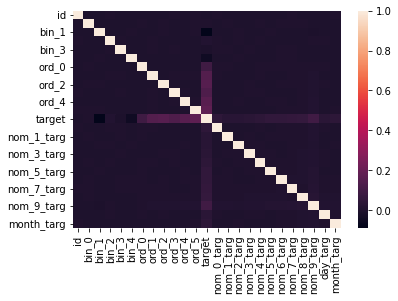

In [ ]:
import seaborn as sns
sns.heatmap(df.corr())
df.corr()['target']



---


> From above results p-Value for "bin_0" and "id" is greater than 0.05 so dropping these features. Also we can see that independent variables are not correlated with each other. 


---








## **5. Multiple Optimized Models**

### **5.1 Logistic Regression Scikit-Learn**

Using One Hot Encoded Data

In [ ]:
y = dftrain['target'] #copy target data in 
X_train = df_work_sprs[:y.shape[0]] #training dataset
X_test = df_work_sprs[y.shape[0]:] #testing dataset

First, Let's use the base model and predict the outcome.

In [ ]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(max_iter=1000) #Initializing Logistic base model with no hyperparameters
clf.fit(X_train, y) #Fitting data to model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
y_preds = clf.predict_proba(X_test)[:,1] #predicting outcome on test dataset

#Here i'm just converting outcome to kaggle submission format and downloading CSV
final = pd.DataFrame(y_preds)
final['id'] = dftest['id']
final = final[['id',0]]
final['target'] = final[0]
final = final[['id','target']]

final.to_csv("Submission_LogisticBaseModelOneHOT.csv", index=False)

from google.colab import files
files.download('Submission_LogisticBaseModelOneHOT.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

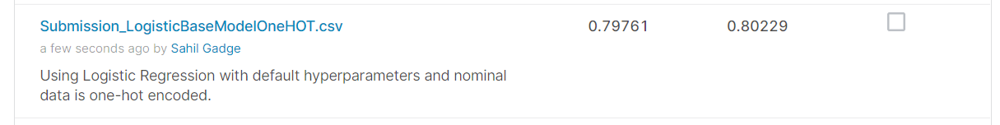

From kaggle submission result of base logistic model we can see that we got public score of 0.80229 and private score of 0.79761




> Now using Gridsearch to find best hyperparameters for our logitic regression model



In [ ]:
from sklearn.model_selection import GridSearchCV
import numpy as np
from sklearn.linear_model import LogisticRegression
#Instantiate
clf = LogisticRegression(solver='lbfgs',  verbose=0, n_jobs=-1) 

#Grid

grid={"C":[0.01,0.1,0.5,0.75,1,1.5],"max_iter":[500,1000,2000], "penalty":["l2"]}
#Gridsearch
gridsearch = GridSearchCV(clf,grid)
gridsearch.fit(X_train, y)

#Get best hyperparameters
gridsearch.best_params_

{'C': 0.1, 'max_iter': 500, 'penalty': 'l2'}

Here 
1. max_iter = Maximum number of iterations taken for the solvers to converge
2. C = Inverse regularization parameter - A control variable that retains strength modification of Regularization by being inversely positioned to the Lambda regulator.
Given how Scikit cites it as being:
C = 1/λ
3. penalty = L1 regularization technique is called Lasso Regression and model which uses L2 is called Ridge Regression.
4. solver = https://stackoverflow.com/questions/38640109/logistic-regression-python-solvers-definitions


In [ ]:
from sklearn.linear_model import LogisticRegression

# Using hyperparameters to optimize the logistic regression
 
clf = LogisticRegression(max_iter=500, C=0.12,solver='lbfgs',n_jobs=-1, verbose=0)
clf.fit(X_train, y)

y_preds = clf.predict_proba(X_test)[:,1]

#Here i'm just converting outcome to kaggle submission format and downloading CSV
final = pd.DataFrame(y_preds)
final['id'] = dftest['id']
final = final[['id',0]]
final['target'] = final[0]
final = final[['id','target']]

final.to_csv("Submission_LogisticOptimizedModelOneHOT.csv", index=False)

from google.colab import files
files.download('Submission_LogisticOptimizedModelOneHOT.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

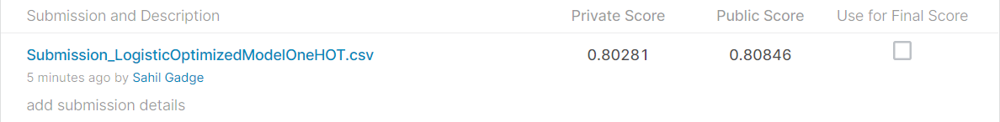

From kaggle submission result of optimized logistic model we can see that we got public score of 0.80846 and private score of 0.80281.




> And this shows that tunine hyperparameter was helpful to improve model as it improved score.



Using Target Encoded Data

In [ ]:
#Dropping "id", "bin_0" because they do not contribute in prediction of target variable. Please scroll down to see OLS for proof

y = dftrain['target'] #copy target data in 

df.drop(df[['id','bin_0']], inplace=True, axis=1) 

X_train = df[:y.shape[0]] #training dataset
X_test = df[y.shape[0]:] #testing dataset



> Using GridSearchCV to find best hyperparameters for our model



In [ ]:
from sklearn.model_selection import GridSearchCV
import numpy as np
from sklearn.linear_model import LogisticRegression
#Instantiate
clf = LogisticRegression(solver='lbfgs',  verbose=0, n_jobs=-1) 

#Grid

grid={"C":[0.01,0.1,0.5,0.75,1,1.5],"max_iter":[500,1000,2000], "penalty":["l2"]}
#Gridsearch
gridsearch = GridSearchCV(clf,grid)
gridsearch.fit(X_train, y)

#Get best hyperparameters
gridsearch.best_params_

{'C': 0.01, 'max_iter': 500, 'penalty': 'l2'}



> Using tuned parameters



In [ ]:
from sklearn.linear_model import LogisticRegression

# Using hyperparameters to optimize the logistic regression
 
clf = LogisticRegression(max_iter=500, C=0.01,solver='lbfgs',n_jobs=-1, verbose=0)
clf.fit(X_train, y)

y_preds = clf.predict_proba(X_test)[:,1]

#Here i'm just converting outcome to kaggle submission format and downloading CSV
final = pd.DataFrame(y_preds)
final['id'] = dftest['id']
final = final[['id',0]]
final['target'] = final[0]
final = final[['id','target']]

final.to_csv("Submission_LogisticOptimizedModelTarget.csv", index=False)

from google.colab import files
files.download('Submission_LogisticOptimizedModelTarget.csv')

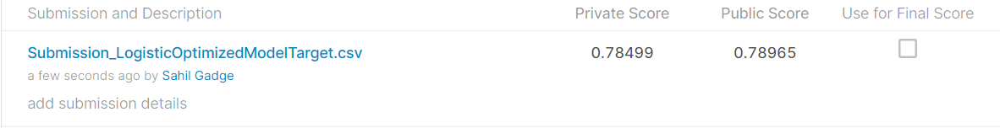



---



> From this it is clear that Logistic Regression is performing better with One Hot Encoding than Target Encoding.



---



#### **5.1.1 Logistic Regression Model Explain**



> Using Shap library to interprete the model



In [ ]:
%%capture
!pip install shap
import shap 

In [ ]:
X = X_train.sample(frac=0.01,random_state=200) # Using 1% of data because shap cannot handle thousands of entries
explainer = shap.LinearExplainer(clf, X, feature_perturbation="interventional") # Using linear explainer to explain logistic model
shap_values = explainer.shap_values(X) #Storing shap values

The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, or maskers.Impute)


In [ ]:
shap.initjs() #Initialize java script
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:]) #Explain one row in the data with the model



> Rotating above given graph by 90 degree and plotting it for multiple points will give us following graph



In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)  

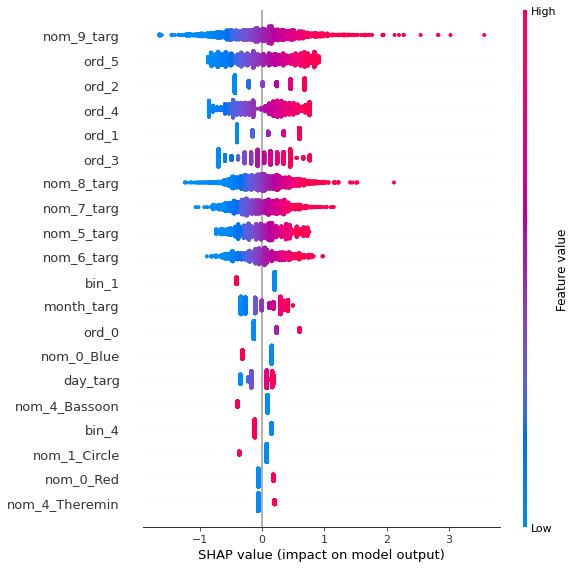

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, X) 

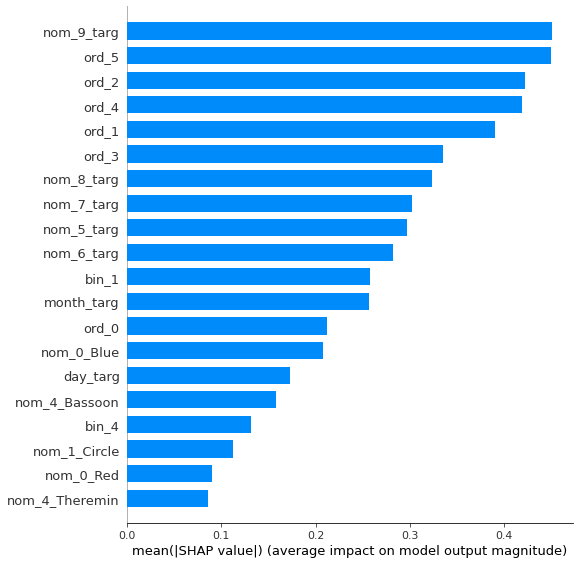

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

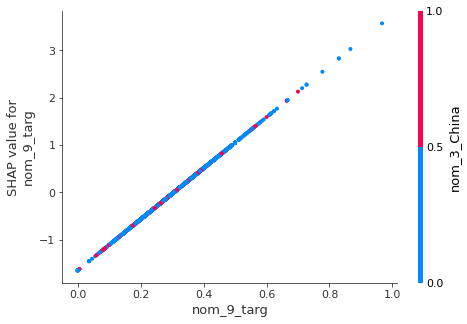

In [ ]:
shap.dependence_plot("nom_9_targ", shap_values, X)



> using model generated coefficient of each independent variables to plot Variable Importance graph 





https://machinelearningmastery.com/calculate-feature-importance-with-python/

Text(0, 0.5, 'Variables')

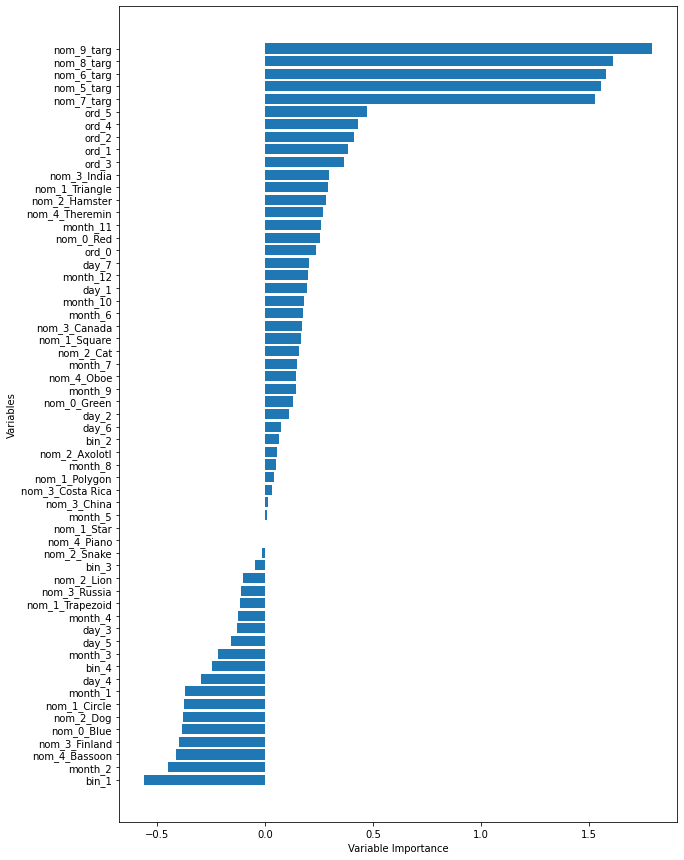

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

af = pd.DataFrame({'features':X_train.columns,
                   'Importance':clf.coef_[0]})
af= af.sort_values(by=['Importance'],ascending=True)

fig = plt.figure(figsize=(10, 15))
plt.barh( af['features'],af['Importance'])
plt.xlabel("Variable Importance")
plt.ylabel("Variables")



---


> Logistic Regression Model Perfomed good with One Hot Encoded Data than Target Encoded Data. Because One Hot Encoded model had 16000 independent variables it is difficult to plot variable importance plot. And in the case of target encoded model we plotted varibale importance graph and from that graph it is clear that High cardinal nominal varibles and ordinal variables have high positive impact on prediction and data variable, bin_1 and low cardanility Nominal varibles have high negative impact on prediction.



---



One hot encoded model is trained using the 16000 coloums created because of the encoding of the nominal data. After encoding we are saving data in sparce matrix because pandas is not able to store data of size 16000x300000. And sparce matrix removes coloumn name therefore it is hard to use model interpretability.

### **5.2 Random Forest Scikit-Learn**



---


Using One Hot Encoded Data



---




> Tuning hyper parameters.


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(random_state=42)
param_grid = { 
    'criterion' :['gini', 'entropy'],
    'max_depth': [10,20,50],
    'max_features': ['auto'],
    'n_estimators': [200]

}
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, y)
CV_rfc.best_params_

{'criterion': 'gini',
 'max_depth': 50,
 'max_features': 'auto',
 'n_estimators': 200}

In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(criterion='gini',
 max_depth=100,
  max_features='auto',
 n_estimators=200, random_state=0,verbose=1)
clf.fit(X_train, y)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed: 28.8min finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=100, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=0, verbose=1,
                       warm_start=False)

In [ ]:
y_preds = clf.predict_proba(X_test)[:,1]

final = pd.DataFrame(y_preds)
final['id'] = dftest['id']
final = final[['id',0]]
final['target'] = final[0]
final = final[['id','target']]

final.to_csv("Submission_RandomForestOptimizedOneHot.csv", index=False)

from google.colab import files
files.download('Submission_RandomForestOptimizedOneHot.csv')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   28.1s finished


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

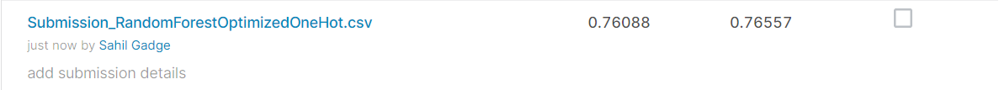



---


Using Target Encoded Data



---




> Tuning hyper parameters.


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(random_state=42)
param_grid = { 
    'criterion' :['gini', 'entropy'],
    'max_depth': [50,100],
    'max_features': ['auto'],
    'n_estimators': [200]

}
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, y)
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'auto',
 'n_estimators': 200}



> Tuning hyper parameters.


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(random_state=42)
param_grid = { 
    'criterion' :['entropy'],
    'max_depth': [50],
    'max_features': ['auto'],
    'n_estimators': [100,200,300]

}
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, y)
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'auto',
 'n_estimators': 300}

In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(criterion='entropy',
  max_depth=50,
  max_features='auto',
  n_estimators=300, random_state=0,verbose=1)
clf.fit(X_train, y)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:  5.0min finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=50, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=0, verbose=1,
                       warm_start=False)

In [ ]:
y_preds = clf.predict_proba(X_test)[:,1] #Predict the test set

# Converting tested dataframe to the csv
final = pd.DataFrame(y_preds) 
final['id'] = dftest['id']
final = final[['id',0]]
final['target'] = final[0]
final = final[['id','target']]

final.to_csv("Submission_RandomForestOptimizedTarget.csv", index=False)

from google.colab import files
files.download('Submission_RandomForestOptimizedTarget.csv')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   49.8s finished


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

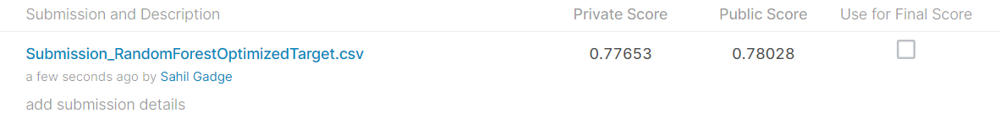



---



> Target Encoded Dataset perform well than one hot encoded data when we use Random Forest on this dataset.



---


#### **5.2.2 Random Forest Tree Model Explain**

In [ ]:
%%capture
!pip install shap #Install shap
import shap  #Import

In [ ]:
X = X_train.head(10) # Shap will crash if we take huge data so slice 
explainer = shap.TreeExplainer(clf) #Use tree explainer to explain rdf model
shap_values = explainer.shap_values(X) #Explain rows from X

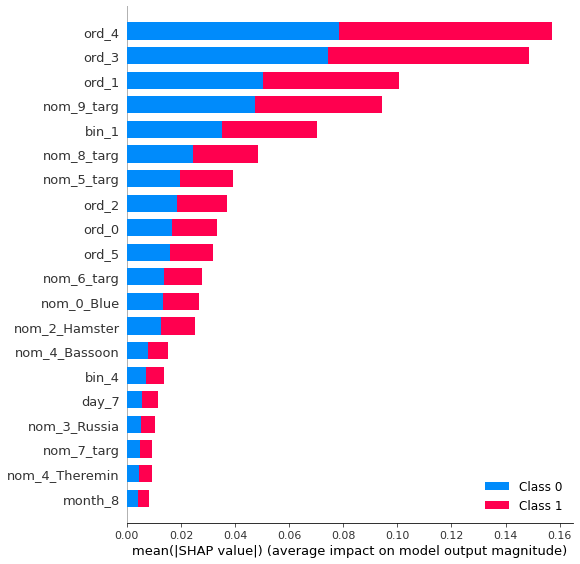

In [ ]:
shap.initjs() #Initialize java script
shap.summary_plot(shap_values, X_train) #Summary plot to find variable importance



> Ordinal and High Cardinality Nominal Variables are important in Random Forest 



In [ ]:
choosen_instance = X.loc[[1]] #To Explain only one row from data
shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)



> Base is 0.3059 and blue ord_4, ord_3, nom_9_targ are mainly responsible behind the lower push of the prediction



In [ ]:
shap.initjs()
j=0
shap.force_plot(explainer.expected_value[1], shap_values[1],X) #Explain every row in dataframe 90 degree rotation of plot above

Text(0, 0.5, 'Variables')

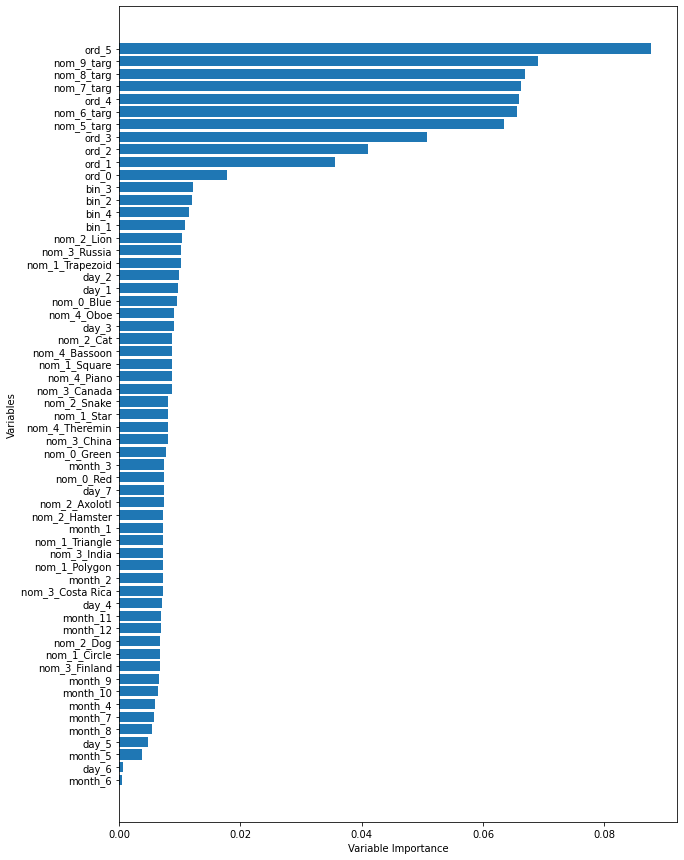

In [ ]:
#In built varible importance from Random forest algorithm
import matplotlib.pyplot as plt
%matplotlib inline

af = pd.DataFrame({'features':X_train.columns,
                   'Importance':clf.feature_importances_})
af= af.sort_values(by=['Importance'],ascending=True)

fig = plt.figure(figsize=(10, 15))
plt.barh( af['features'],af['Importance'])
plt.xlabel("Variable Importance")
plt.ylabel("Variables")



---



> Built in variable impotance plot of Random Forest also points out that Ordinal and highcardiniality Nominal Variables are import for prediction.



---



### **5.3 AutoML H2O**

#### **5.3.1 Init**

In [ ]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o #Download H2O
import h2o
from h2o.estimators.gbm import H2OGradientBoostingEstimator
h2o.init() #Initialize
h2o.cluster().show_status() 

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     |████████████████████████████████| 175.8 MB 18 kB/s 
  Created wheel for h2o: filename=h2o-3.34.0.3-py2.py3-none-any.whl size=175832480 sha256=4e9e71fed3b0ef039594dcf498f6badceaf0ed7e928ad9fef5f7fd4fe98cbd72
  Stored in directory: /root/.cache/pip/wheels/2a/52/cf/01f6938288f0731963463ff72510db67f9f3076f801038b2f7
Successfully built h2o
Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.11" 2021-04-20; OpenJDK Runtime Environment (build 11.0.11+9-Ubuntu-0ubuntu2.18.04); OpenJDK 64-Bit Server VM (build 11.0.11+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmplhlqwsyc
  JVM stdout: /tmp/tmplhlqwsyc/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmplhlqwsyc/h2o_unknownUser_

H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.3
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_zg8p5o
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.3
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_zg8p5o
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
import pandas as pd

#Importing data 
#Preprossessing Binary and ordinal data

binvar = ['bin_' + str(i) for i in range(5)] # Assigning binvar list to all binary feature names in dataset
ordvar = ['ord_' + str(i) for i in range(6)] # Assigning ordvar list to all ordinal feature names in dataset
df = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-1.csv")
df1 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-2.csv")
df2 = pd.read_csv("https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/train-3.csv")
#Combine these 3 dataframes to get our dataset
df = pd.concat([df, df1,df2]) 

df['bin_3'] = df['bin_3'].map({'F':0, 'T':1})
df['bin_4'] = df['bin_4'].map({'N':0, 'Y':1})

from sklearn.preprocessing import OrdinalEncoder

df['ord_0'] = df['ord_0'] - 1

ord1dict = {'Novice':0, 'Contributor':1, 'Expert':2, 'Master':3, 'Grandmaster':4}
df['ord_1'] = df['ord_1'].map(ord1dict)

ord2dict = {'Freezing':0, 'Cold':1, 'Warm':2, 'Hot':3, 'Boiling Hot':4, 'Lava Hot':5}
df['ord_2'] = df['ord_2'].map(ord2dict)

oe = OrdinalEncoder(categories='auto')
df[ordvar[3:]] = oe.fit_transform(df[ordvar[3:]])

from sklearn.preprocessing import StandardScaler
df[ordvar] = StandardScaler().fit_transform(df[ordvar])

In [ ]:
hf = h2o.H2OFrame(df)

#Remaining Nominal data is assigned as catogorical data so that H2O can automatically process it

hf["nom_0"]=hf["nom_0"].asfactor()
hf["nom_1"]=hf["nom_1"].asfactor()
hf["nom_2"]=hf["nom_2"].asfactor()
hf["nom_3"]=hf["nom_3"].asfactor()
hf["nom_4"]=hf["nom_4"].asfactor()
hf["nom_5"]=hf["nom_5"].asfactor()
hf["nom_6"]=hf["nom_6"].asfactor()
hf["nom_7"]=hf["nom_7"].asfactor()
hf["nom_8"]=hf["nom_8"].asfactor()
hf["nom_9"]=hf["nom_9"].asfactor()
hf["day"]=hf["day"].asfactor()
hf["month"]=hf["month"].asfactor()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


#### **5.3.2 H2O Model Training and Prediction**

In [ ]:
from h2o.automl import H2OAutoML #AutoML import
aml = H2OAutoML(max_models=5, seed=1) #Max 5 models can be used in AutoML
x=hf.columns
y="target"
x.remove(y)
x.remove("id")
x.remove("bin_0")
aml.train(x=x, y=y, training_frame=hf) #Train Model

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_3_AutoML_1_20211027_145814

No model summary for this model

ModelMetricsRegression: stackedensemble
** Reported on train data. **

MSE: 0.1610582401727454
RMSE: 0.40132062016889364
MAE: 0.3213266950474112
RMSLE: 0.2803907802274252
Mean Residual Deviance: 0.1610582401727454

ModelMetricsRegression: stackedensemble
** Reported on cross-validation data. **

MSE: 0.1624783968043479
RMSE: 0.4030860910579127
MAE: 0.32553099056567514
RMSLE: 0.28286139962629175
Mean Residual Deviance: 0.1624783968043479


In [ ]:
print(aml.leaderboard) #Leaderboard of the best model 

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_3_AutoML_1_20211027_145814,0.162478,0.403086,0.162478,0.325531,0.282861
StackedEnsemble_BestOfFamily_4_AutoML_1_20211027_145814,0.162503,0.403117,0.162503,0.325509,0.282888
StackedEnsemble_BestOfFamily_3_AutoML_1_20211027_145814,0.163144,0.403911,0.163144,0.324863,0.283419
StackedEnsemble_AllModels_2_AutoML_1_20211027_145814,0.163193,0.403972,0.163193,0.324899,0.283463
StackedEnsemble_AllModels_1_AutoML_1_20211027_145814,0.16537,0.406657,0.16537,0.344179,0.288264
StackedEnsemble_BestOfFamily_2_AutoML_1_20211027_145814,0.16538,0.406669,0.16538,0.344383,0.28835
StackedEnsemble_AllModels_4_AutoML_1_20211027_145814,0.165425,0.406725,0.165425,0.3445,0.287869
StackedEnsemble_BestOfFamily_5_AutoML_1_20211027_145814,0.165435,0.406737,0.165435,0.344813,0.287902
StackedEnsemble_BestOfFamily_1_AutoML_1_20211027_145814,0.16544,0.406743,0.16544,0.344976,0.288572
GLM_1_AutoML_1_20211027_145814,0.165644,0.406994,0.165644,0.347646,0.288449


In [ ]:
import pandas as pd
#Importing and preprossesing the Test dataset 
df=pd.read_csv('https://raw.githubusercontent.com/SahilGadge/Data-Sci-Engg-Methods/main/test.csv')
df['bin_3'] = df['bin_3'].map({'F':0, 'T':1})
df['bin_4'] = df['bin_4'].map({'N':0, 'Y':1})

from sklearn.preprocessing import OrdinalEncoder

df['ord_0'] = df['ord_0'] - 1

ord1dict = {'Novice':0, 'Contributor':1, 'Expert':2, 'Master':3, 'Grandmaster':4}
df['ord_1'] = df['ord_1'].map(ord1dict)

ord2dict = {'Freezing':0, 'Cold':1, 'Warm':2, 'Hot':3, 'Boiling Hot':4, 'Lava Hot':5}
df['ord_2'] = df['ord_2'].map(ord2dict)

oe = OrdinalEncoder(categories='auto')
df[ordvar[3:]] = oe.fit_transform(df[ordvar[3:]])

from sklearn.preprocessing import StandardScaler
df[ordvar] = StandardScaler().fit_transform(df[ordvar])

hftest = h2o.H2OFrame(df)
hftest["nom_0"]=hftest["nom_0"].asfactor()
hftest["nom_1"]=hftest["nom_1"].asfactor()
hftest["nom_2"]=hftest["nom_2"].asfactor()
hftest["nom_3"]=hftest["nom_3"].asfactor()
hftest["nom_4"]=hftest["nom_4"].asfactor()
hftest["nom_5"]=hftest["nom_5"].asfactor()
hftest["nom_6"]=hftest["nom_6"].asfactor()
hftest["nom_7"]=hftest["nom_7"].asfactor()
hftest["nom_8"]=hftest["nom_8"].asfactor()
hftest["nom_9"]=hftest["nom_9"].asfactor()
hftest["day"]=hftest["day"].asfactor()
hftest["month"]=hftest["month"].asfactor()
#predict = hf_gbm.predict(hftest)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%




> Predicting using the best model from the leaderboard which is Stacked Ensemble Model



In [ ]:
best_model = h2o.get_model(aml.leaderboard[0,'model_id'])
predictions1 = best_model.predict(hftest)
print(best_model)
subm=h2o.as_list(predictions1)
final = pd.DataFrame(subm)
final['id'] = dftest['id']
final['target'] = final['predict']
final = final[['id','target']]
final.to_csv("Submission_BestH2oMM5.csv", index=False)

from google.colab import files
files.download('Submission_BestH2oMM5.csv')

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_3_AutoML_3_20211027_72242

No model summary for this model

ModelMetricsRegression: stackedensemble
** Reported on train data. **

MSE: 0.1610582401727454
RMSE: 0.40132062016889364
MAE: 0.3213266950474112
RMSLE: 0.2803907802274252
Mean Residual Deviance: 0.1610582401727454

ModelMetricsRegression: stackedensemble
** Reported on cross-validation data. **

MSE: 0.1624783968043479
RMSE: 0.4030860910579127
MAE: 0.32553099056567514
RMSLE: 0.28286139962629175
Mean Residual Deviance: 0.1624783968043479



/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_8' has levels not trained on: ["1f0a80e1d", "2be51c868", "a9bf3dc47", "ec337ce4c"]
  warnings.warn(w)
/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_9' has levels not trained on: ["006d59dba", "06b629fcd", "0c4a1cf34", "0cc35e186", "11ac3a364", "16c23cafe", "17638b95e", "248d87c9d", "2497c8bcb", "25b4ca9bb", ...67 not listed..., "e45838711", "e7a93ce71", "e8d79201b", "e9d7cba73", "ea57886d6", "ec5b80639", "f2afe9840", "fa260216c", "fa6771844", "fc198175f"]
  warnings.warn(w)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

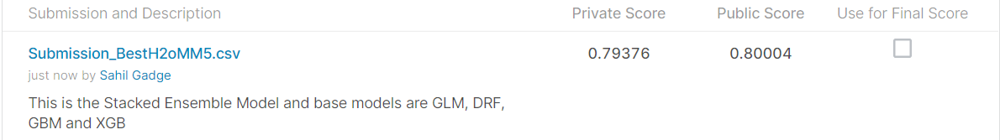



> Best Model predicts outcome with 80% aaccuracy



#### **5.3.2 H2O Model Interpretation and Reports**



> From this plot it is clear that for different algorithms different variables are important


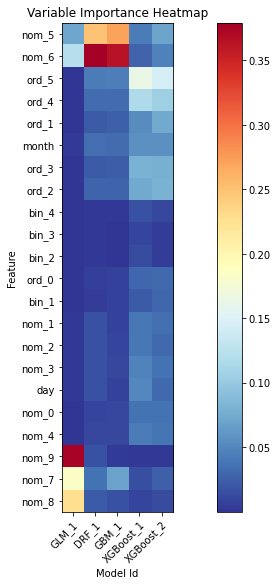

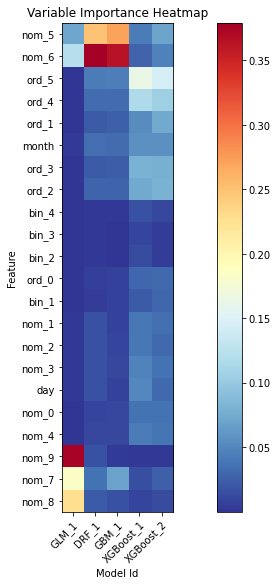

In [ ]:
aml.varimp_heatmap()



> From this plot we can see how different models are correlated with each other


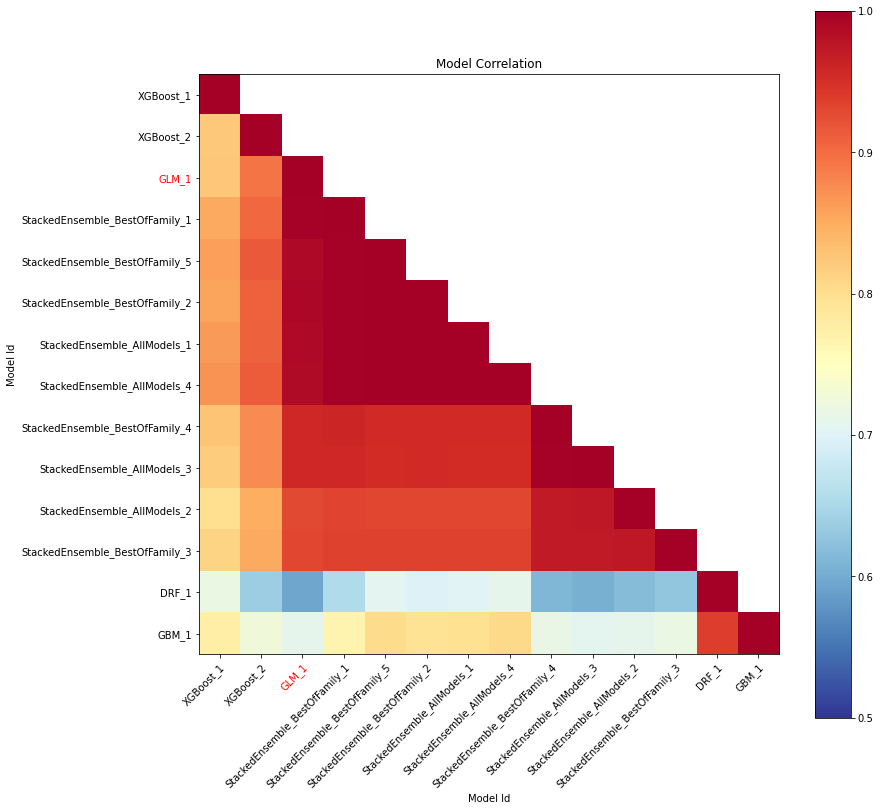

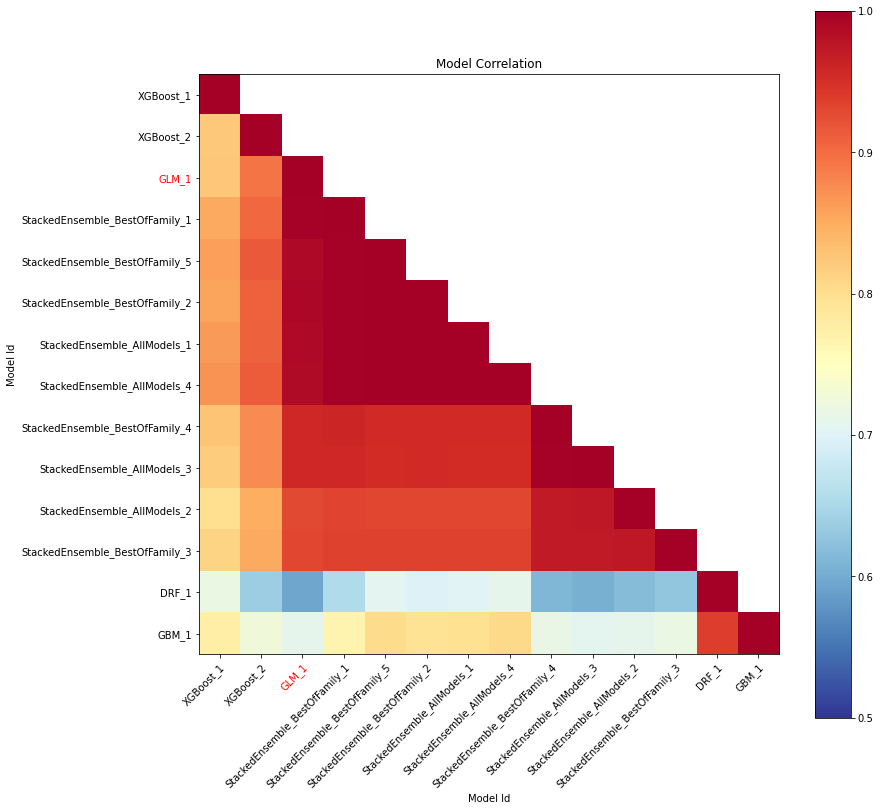

In [ ]:
aml.model_correlation_heatmap(hf)

#### **5.3.3 H2O model XGBoost**

In [ ]:
xgb = h2o.get_model(aml.leaderboard[10,'model_id']) #XGBoost is 11th algorithm in the leaderboard
print(xgb.algo)

#Using XGB for prediction and converting prediction to CSV
predictions1 = xgb.predict(hftest)
print(xgb)
subm=h2o.as_list(predictions1) 
final = pd.DataFrame(subm)
final['id'] = dftest['id']
final['target'] = final['predict']
final = final[['id','target']]
final.to_csv("Submission_H2O_XGB2.csv", index=False)

from google.colab import files
files.download('Submission_H2O_XGB2.csv')


xgboost
xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%
Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_1_20211027_145814


Model Summary: 


/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_9' has levels not trained on: ["006d59dba", "06b629fcd", "0c4a1cf34", "0cc35e186", "11ac3a364", "16c23cafe", "17638b95e", "248d87c9d", "2497c8bcb", "25b4ca9bb", ...67 not listed..., "e45838711", "e7a93ce71", "e8d79201b", "e9d7cba73", "ea57886d6", "ec5b80639", "f2afe9840", "fa260216c", "fa6771844", "fc198175f"]
  warnings.warn(w)
/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_8' has levels not trained on: ["1f0a80e1d", "2be51c868", "a9bf3dc47", "ec337ce4c"]
  warnings.warn(w)


,,number_of_trees
0,,52.0




ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 0.15123094949091861
RMSE: 0.3888842366192266
MAE: 0.3217749029795329
RMSLE: 0.27324889900192784
Mean Residual Deviance: 0.15123094949091861

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 0.17533212019389924
RMSE: 0.4187267846626237
MAE: 0.3467824570741256
RMSLE: 0.29465299154132696
Mean Residual Deviance: 0.17533212019389924

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.346782,0.001052,0.348055,0.347075,0.346228,0.347253,0.345301
1,mean_residual_deviance,0.175332,0.001353,0.176934,0.175836,0.174725,0.175809,0.173356
2,mse,0.175332,0.001353,0.176934,0.175836,0.174725,0.175809,0.173356
3,r2,0.174194,0.004793,0.169052,0.174933,0.175930,0.170128,0.180928
4,residual_deviance,0.175332,0.001353,0.176934,0.175836,0.174725,0.175809,0.173356
5,rmse,0.418724,0.001617,0.420636,0.419328,0.418001,0.419296,0.416360
6,rmsle,0.294652,0.001027,0.295830,0.294671,0.294293,0.295316,0.293147



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
0,,2021-10-27 15:46:12,3 min 29.222 sec,0.0,0.500000,0.500000,0.250000
1,,2021-10-27 15:46:16,3 min 32.956 sec,5.0,0.418948,0.381261,0.175517
2,,2021-10-27 15:46:19,3 min 35.975 sec,10.0,0.406939,0.349386,0.165600
3,,2021-10-27 15:46:22,3 min 39.013 sec,15.0,0.402252,0.339106,0.161806
4,,2021-10-27 15:46:25,3 min 42.050 sec,20.0,0.399422,0.334916,0.159538
5,,2021-10-27 15:46:28,3 min 45.334 sec,25.0,0.397180,0.331748,0.157752
6,,2021-10-27 15:46:32,3 min 48.930 sec,30.0,0.395174,0.329118,0.156163
7,,2021-10-27 15:46:37,3 min 53.772 sec,35.0,0.393603,0.327562,0.154923
8,,2021-10-27 15:46:40,3 min 57.284 sec,40.0,0.392151,0.325968,0.153783
9,,2021-10-27 15:46:44,4 min 0.653 sec,45.0,0.390747,0.324035,0.152683



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,ord_5,3990.057617,1.000000,0.145160
1,ord_4,2895.825684,0.725760,0.105351
2,ord_2,2227.000000,0.558137,0.081019
3,ord_3,2182.690674,0.547032,0.079407
4,ord_1,2049.838135,0.513736,0.074574
5,ord_0,887.335632,0.222387,0.032282
6,bin_1,817.908813,0.204987,0.029756
7,nom_0.Blue,742.395081,0.186061,0.027009
8,nom_4.Bassoon,550.706665,0.138020,0.020035
9,month.2,407.409943,0.102106,0.014822



See the whole table with table.as_data_frame()



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

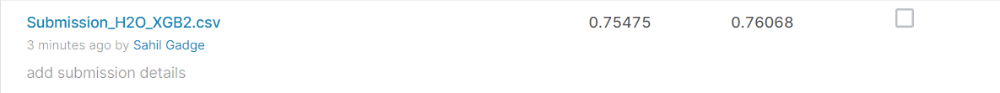

/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_9' has levels not trained on: ["006d59dba", "06b629fcd", "0c4a1cf34", "0cc35e186", "11ac3a364", "16c23cafe", "17638b95e", "248d87c9d", "2497c8bcb", "25b4ca9bb", ...67 not listed..., "e45838711", "e7a93ce71", "e8d79201b", "e9d7cba73", "ea57886d6", "ec5b80639", "f2afe9840", "fa260216c", "fa6771844", "fc198175f"]
  warnings.warn(w)
/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_8' has levels not trained on: ["1f0a80e1d", "2be51c868", "a9bf3dc47", "ec337ce4c"]
  warnings.warn(w)


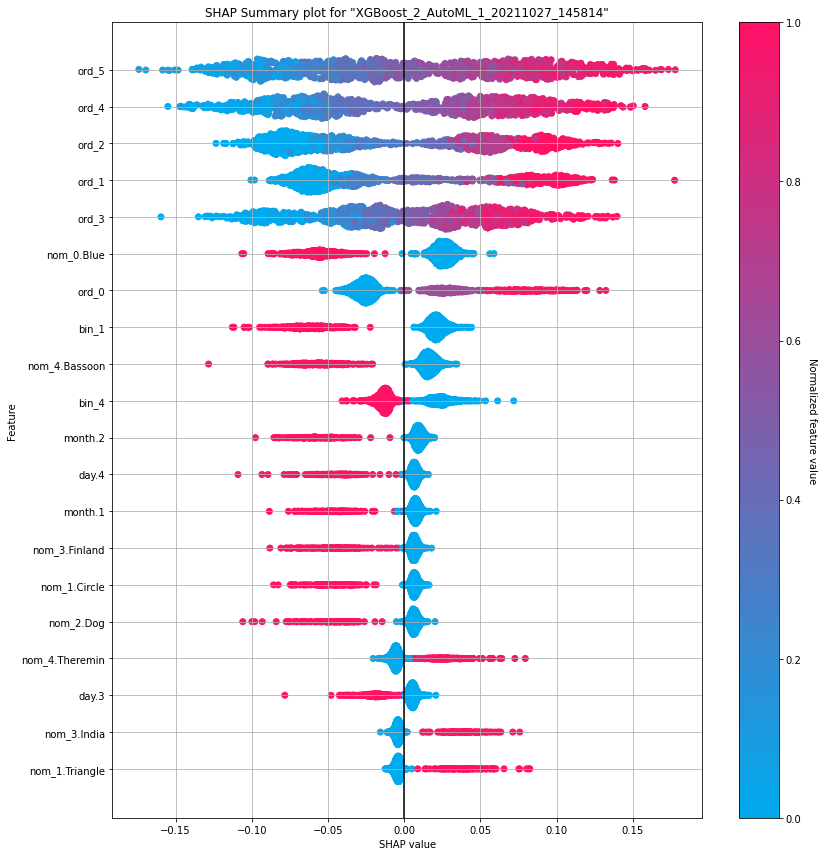

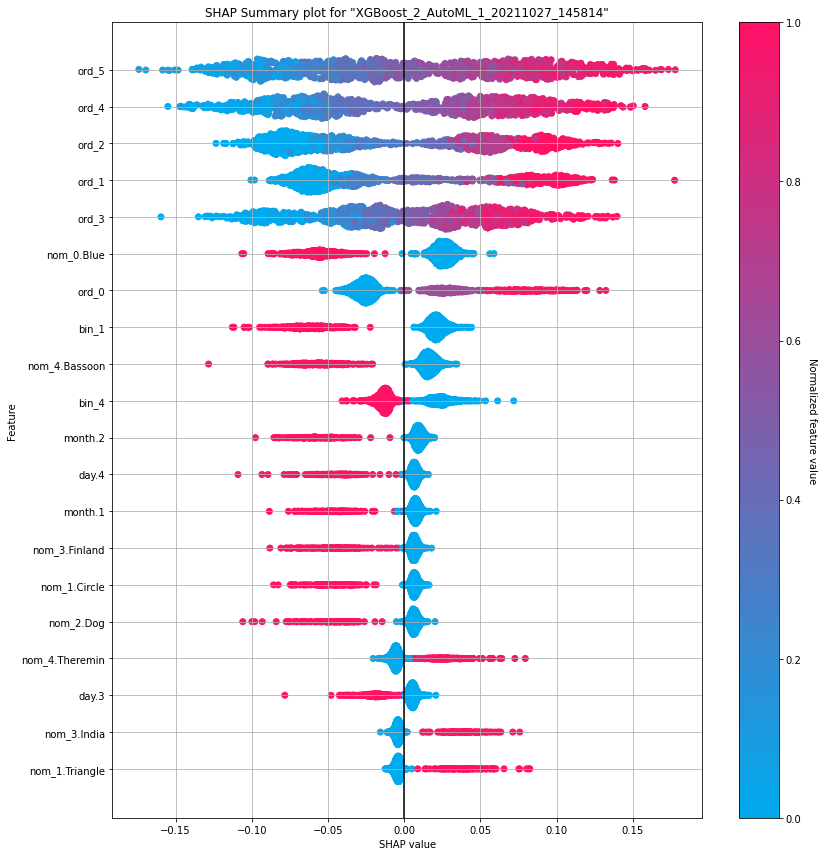

In [ ]:
xgb.shap_summary_plot(hftest) #Shap Summary plot 



> Ordinal Variables are importamt in XGB



#### **5.3.4 H2O model GBM**

In [ ]:
gbm = h2o.get_model(aml.leaderboard[11,'model_id']) #Gradient Boosting Machine is 12th algorithm
print(gbm.algo)
#glm.explain(hf)

#Using GBM for prediction and converting it to CSV
predictions1 = gbm.predict(hftest)
print(gbm)
subm=h2o.as_list(predictions1)
final = pd.DataFrame(subm)
final['id'] = dftest['id']
final['target'] = final['predict']
final = final[['id','target']]
final.to_csv("Submission_H2O_gbm.csv", index=False)

from google.colab import files
files.download('Submission_H2O_gbm.csv')

gbm
gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_1_AutoML_1_20211027_145814


Model Summary: 


/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_8' has levels not trained on: ["1f0a80e1d", "2be51c868", "a9bf3dc47", "ec337ce4c"]
  warnings.warn(w)
/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_9' has levels not trained on: ["006d59dba", "06b629fcd", "0c4a1cf34", "0cc35e186", "11ac3a364", "16c23cafe", "17638b95e", "248d87c9d", "2497c8bcb", "25b4ca9bb", ...67 not listed..., "e45838711", "e7a93ce71", "e8d79201b", "e9d7cba73", "ea57886d6", "ec5b80639", "f2afe9840", "fa260216c", "fa6771844", "fc198175f"]
  warnings.warn(w)


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,50.0,50.0,3978378.0,15.0,15.0,15.0,1363.0,1824.0,1766.42




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.05732798577626203
RMSE: 0.23943263306463058
MAE: 0.19519571136654293
RMSLE: 0.16810752600610862
Mean Residual Deviance: 0.05732798577626203

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.18041860031591642
RMSE: 0.4247571074342564
MAE: 0.35234125830883833
RMSLE: 0.29826255979525274
Mean Residual Deviance: 0.18041860031591642

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.350799,0.001509,0.351775,0.350597,0.349930,0.352764,0.348929
1,mean_residual_deviance,0.180500,0.000968,0.181371,0.181213,0.180355,0.180624,0.178936
2,mse,0.180500,0.000968,0.181371,0.181213,0.180355,0.180624,0.178936
3,r2,0.149851,0.002789,0.148216,0.149699,0.149376,0.147400,0.154561
4,residual_deviance,0.180500,0.000968,0.181371,0.181213,0.180355,0.180624,0.178936
5,rmse,0.424852,0.001141,0.425877,0.425692,0.424682,0.424999,0.423009
6,rmsle,0.298320,0.000678,0.299004,0.298537,0.298184,0.298646,0.297227



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
0,,2021-10-27 15:41:34,6 min 21.019 sec,0.0,0.460779,0.424635,0.212317
1,,2021-10-27 15:41:40,6 min 27.320 sec,5.0,0.419649,0.383104,0.176105
2,,2021-10-27 15:41:47,6 min 34.054 sec,10.0,0.381802,0.342560,0.145772
3,,2021-10-27 15:41:54,6 min 41.043 sec,15.0,0.351409,0.309393,0.123488
4,,2021-10-27 15:42:00,6 min 47.300 sec,20.0,0.330452,0.286227,0.109198
5,,2021-10-27 15:42:07,6 min 53.673 sec,25.0,0.310662,0.265128,0.096511
6,,2021-10-27 15:42:13,7 min 0.590 sec,30.0,0.292791,0.246892,0.085727
7,,2021-10-27 15:42:20,7 min 6.952 sec,35.0,0.278244,0.232368,0.077420
8,,2021-10-27 15:42:26,7 min 13.368 sec,40.0,0.263500,0.218088,0.069432
9,,2021-10-27 15:42:32,7 min 19.559 sec,45.0,0.250982,0.206159,0.062992



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,nom_6,86818.132812,1.000000,0.363651
1,nom_5,64952.191406,0.748141,0.272062
2,nom_7,16430.974609,0.189257,0.068824
3,ord_5,10890.730469,0.125443,0.045617
4,ord_4,8106.370117,0.093372,0.033955
5,month,8086.373047,0.093142,0.033871
6,ord_2,7016.069824,0.080813,0.029388
7,ord_1,6343.887207,0.073071,0.026572
8,ord_3,5917.730957,0.068162,0.024787
9,nom_8,4059.101074,0.046754,0.017002



See the whole table with table.as_data_frame()



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

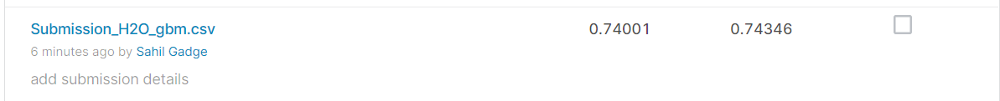

/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_8' has levels not trained on: ["1f0a80e1d", "2be51c868", "a9bf3dc47", "ec337ce4c"]
  warnings.warn(w)
/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_9' has levels not trained on: ["006d59dba", "06b629fcd", "0c4a1cf34", "0cc35e186", "11ac3a364", "16c23cafe", "17638b95e", "248d87c9d", "2497c8bcb", "25b4ca9bb", ...67 not listed..., "e45838711", "e7a93ce71", "e8d79201b", "e9d7cba73", "ea57886d6", "ec5b80639", "f2afe9840", "fa260216c", "fa6771844", "fc198175f"]
  warnings.warn(w)


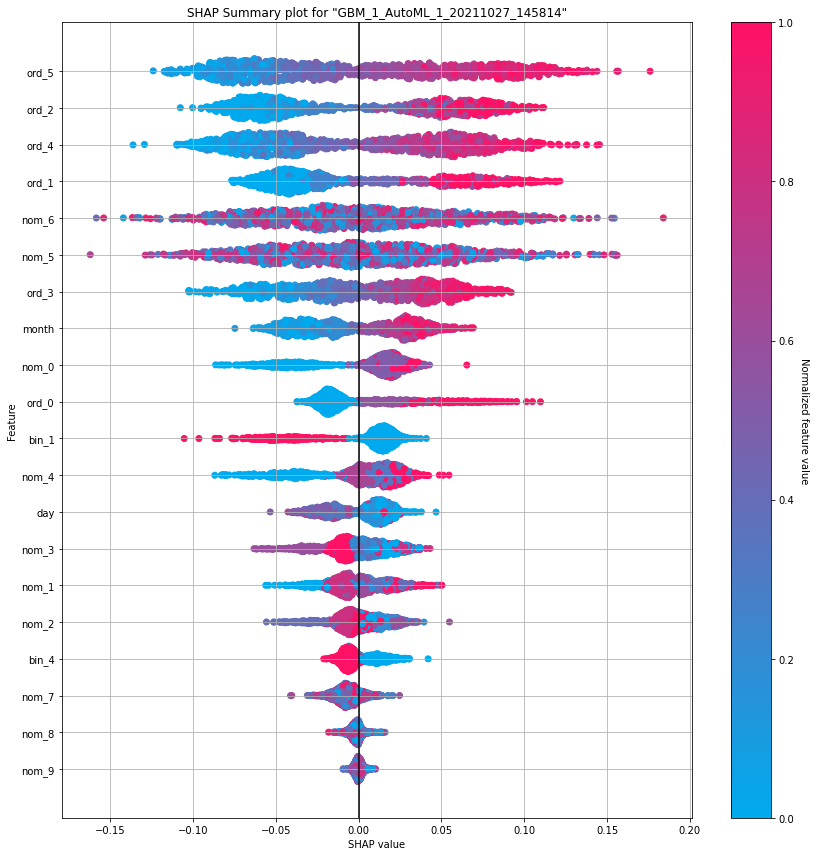

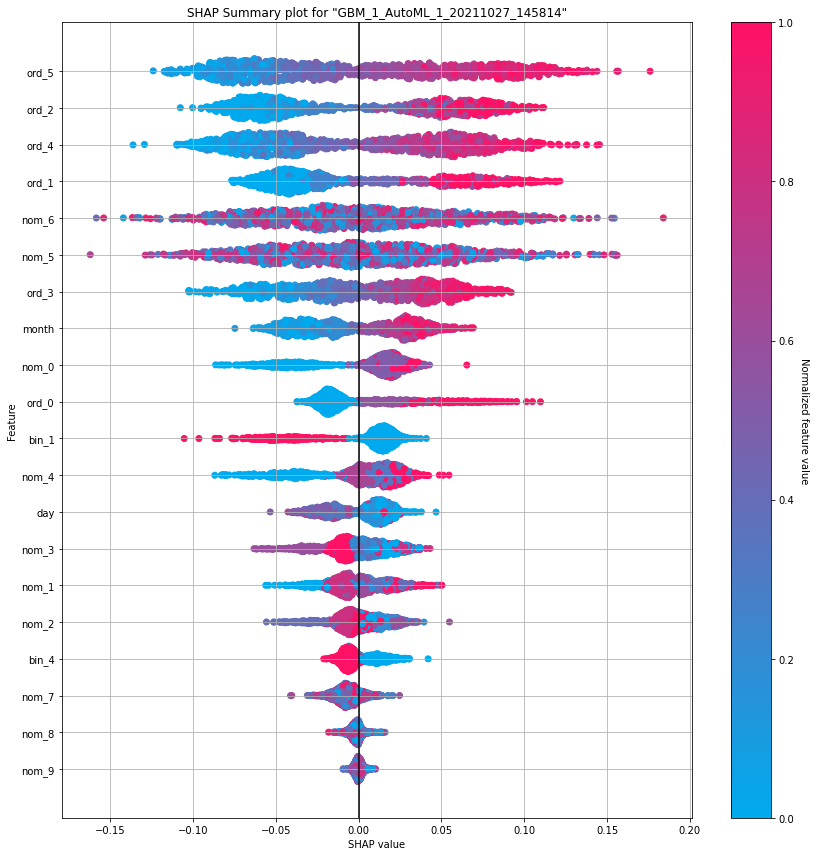

In [ ]:
gbm.shap_summary_plot(hftest) 

#### **5.3.5 H2O model GLM**

In [ ]:
glm = h2o.get_model(aml.leaderboard[9,'model_id'])

print(glm.algo)

predictions1 = glm.predict(hftest)
print(glm)
subm=h2o.as_list(predictions1)
final = pd.DataFrame(subm)
final['id'] = dftest['id']
final['target'] = final['predict']
final = final[['id','target']]
final.to_csv("Submission_H2O_glm.csv", index=False)

from google.colab import files
files.download('Submission_H2O_glm.csv')


glm
glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_1_AutoML_1_20211027_145814


GLM Model: summary


/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_9' has levels not trained on: ["006d59dba", "06b629fcd", "0c4a1cf34", "0cc35e186", "11ac3a364", "16c23cafe", "17638b95e", "248d87c9d", "2497c8bcb", "25b4ca9bb", ...67 not listed..., "e45838711", "e7a93ce71", "e8d79201b", "e9d7cba73", "ea57886d6", "ec5b80639", "f2afe9840", "fa260216c", "fa6771844", "fc198175f"]
  warnings.warn(w)
/usr/local/lib/python3.7/dist-packages/h2o/job.py:83: UserWarning: Test/Validation dataset column 'nom_8' has levels not trained on: ["1f0a80e1d", "2be51c868", "a9bf3dc47", "ec337ce4c"]
  warnings.warn(w)


,,family,link,regularization,lambda_search,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,gaussian,identity,Ridge ( lambda = 2.292E-4 ),"nlambda = 30, lambda.max = 8.1658, lambda.min = 2.292E-4, lambda.1...",16214,16214,100,AutoML_1_20211027_145814_training_py_12_sid_883e




ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.1629201964718872
RMSE: 0.4036337405023113
MAE: 0.34491342473324654
RMSLE: 0.28619674334901063
R^2: 0.23265744198112015
Mean Residual Deviance: 0.1629201964718872
Null degrees of freedom: 299999
Residual degrees of freedom: 283785
Null deviance: 63695.22768000044
Residual deviance: 48876.05894156616
AIC: 339446.6828442702

ModelMetricsRegressionGLM: glm
** Reported on cross-validation data. **

MSE: 0.16564418278028392
RMSE: 0.40699408199663534
MAE: 0.347646196817078
RMSLE: 0.2884491487261721
R^2: 0.21982765987209707
Mean Residual Deviance: 0.16564418278028392
Null degrees of freedom: 299999
Residual degrees of freedom: 283861
Null deviance: 63695.623481249815
Residual deviance: 49693.25483408518
AIC: 344269.139406365

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.347260,0.001455,0.348369,0.346496,0.346786,0.349116,0.345533
1,mean_residual_deviance,0.165633,0.001404,0.166531,0.165579,0.165091,0.167316,0.163646
2,mse,0.165633,0.001404,0.166531,0.165579,0.165091,0.167316,0.163646
3,null_deviance,12739.125000,39.914383,12776.091000,12787.409000,12721.671000,12711.218000,12699.233000
4,r2,0.219873,0.006275,0.217909,0.223059,0.221368,0.210221,0.226807
5,residual_deviance,9937.956000,84.239180,9991.885000,9934.746000,9905.461000,10038.946000,9818.745000
6,rmse,0.406977,0.001726,0.408083,0.406914,0.406314,0.409042,0.404531
7,rmsle,0.288279,0.001085,0.289058,0.288100,0.287861,0.289582,0.286796



Scoring History: 


,,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_xval,deviance_se,alpha,iterations,training_rmse,training_deviance,training_mae,training_r2
0,,2021-10-27 15:27:02,0.000 sec,2,.82E1,16215.0,0.411615,0.206949,0.000305636,0,NaN,,,,
1,,2021-10-27 15:27:02,0.192 sec,4,.51E1,16215.0,0.405464,0.20429,0.000311054,0,NaN,,,,
2,,2021-10-27 15:27:02,0.366 sec,6,.31E1,16215.0,0.39755,0.200738,0.000319641,0,NaN,,,,
3,,2021-10-27 15:27:03,0.697 sec,9,.2E1,16215.0,0.388306,0.196386,0.000333163,0,NaN,,,,
4,,2021-10-27 15:27:03,0.990 sec,12,.12E1,16215.0,0.378695,0.191599,0.000353517,0,NaN,,,,
5,,2021-10-27 15:27:03,1.267 sec,15,.75E0,16215.0,0.369842,0.186937,0.00038081,0,NaN,,,,
6,,2021-10-27 15:27:04,1.529 sec,18,.47E0,16215.0,0.36249,0.182891,0.000413743,0,NaN,,,,
7,,2021-10-27 15:27:02,16.476 sec,19,None,NaN,,,,,19.0,0.420118,0.176499,0.3651,0.168701
8,,2021-10-27 15:27:04,1.789 sec,21,.29E0,16215.0,0.356813,0.179599,0.000450024,0,NaN,,,,
9,,2021-10-27 15:27:04,2.402 sec,24,.18E0,16215.0,0.352485,0.177234,0.000484143,0,NaN,,,,



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,nom_5.115a252ba,0.107001,1.000000,0.001038
1,nom_5.b97f51ac4,0.099187,0.926976,0.000962
2,nom_5.da60580a8,0.098008,0.915958,0.000950
3,nom_5.493de6347,0.097540,0.911580,0.000946
4,nom_5.a3f640358,0.095490,0.892423,0.000926
5,nom_5.be5592604,0.094311,0.881403,0.000915
6,nom_5.e5b29c42b,0.093532,0.874122,0.000907
7,nom_5.dbfb714a4,0.092801,0.867297,0.000900
8,nom_5.908a1b9c9,0.091680,0.856820,0.000889
9,nom_6.eeda68203,0.088319,0.825406,0.000857



See the whole table with table.as_data_frame()



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

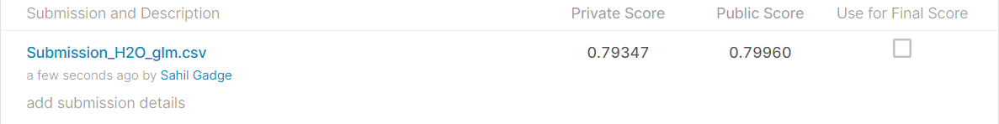


##### **5.3.6 H2O model GLM Interpretability**


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

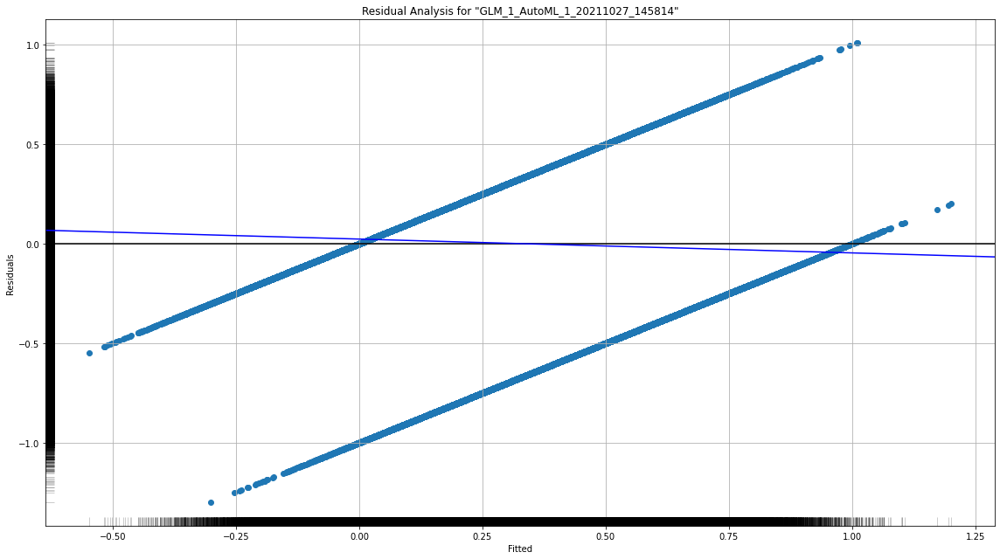

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

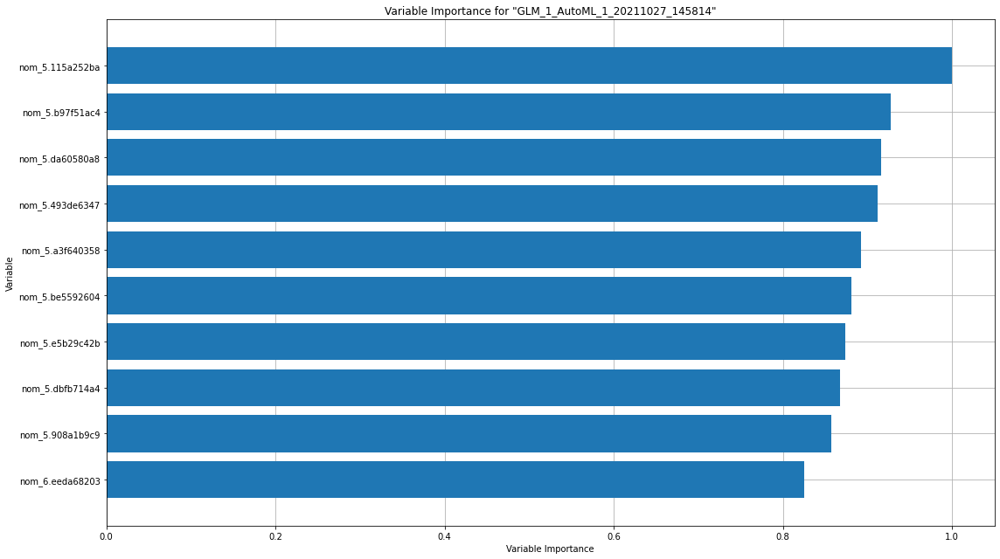

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

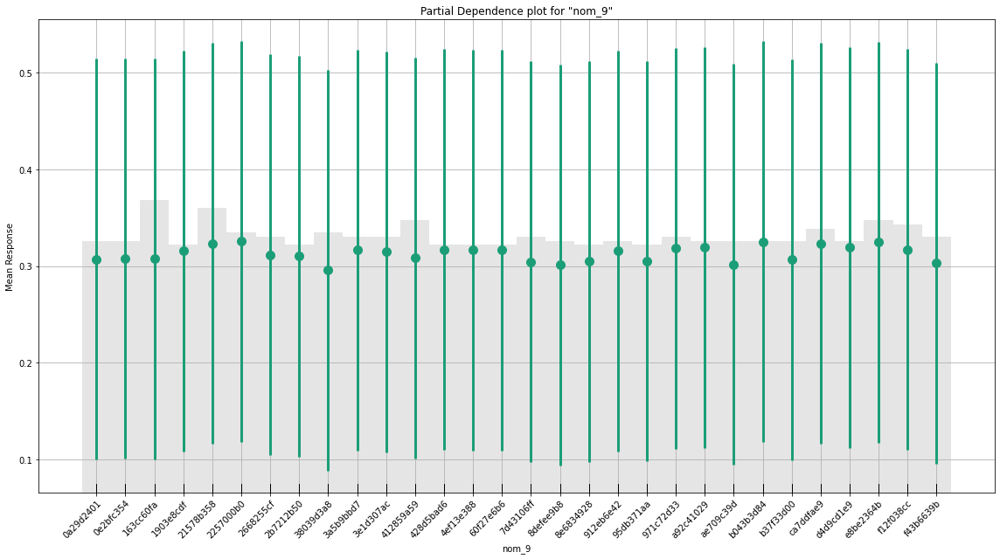

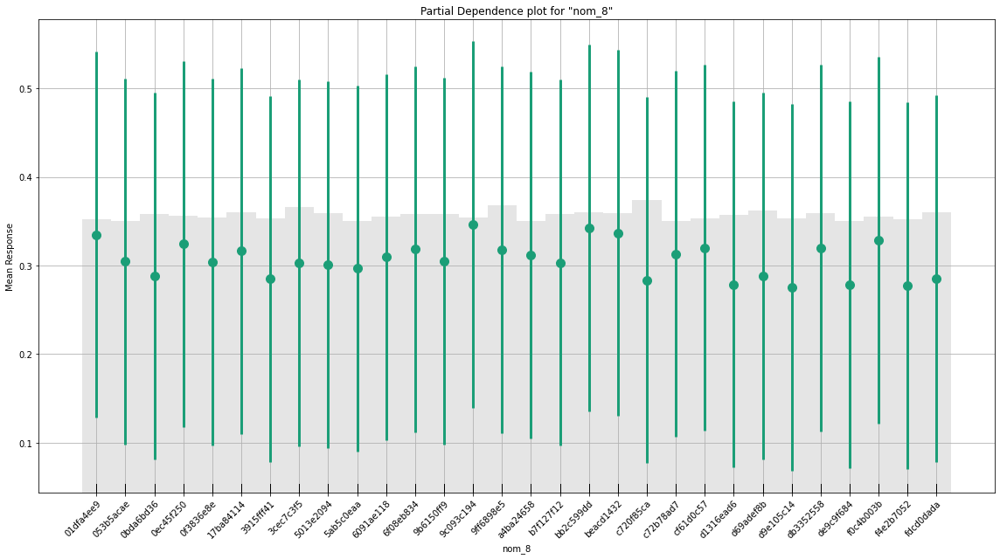

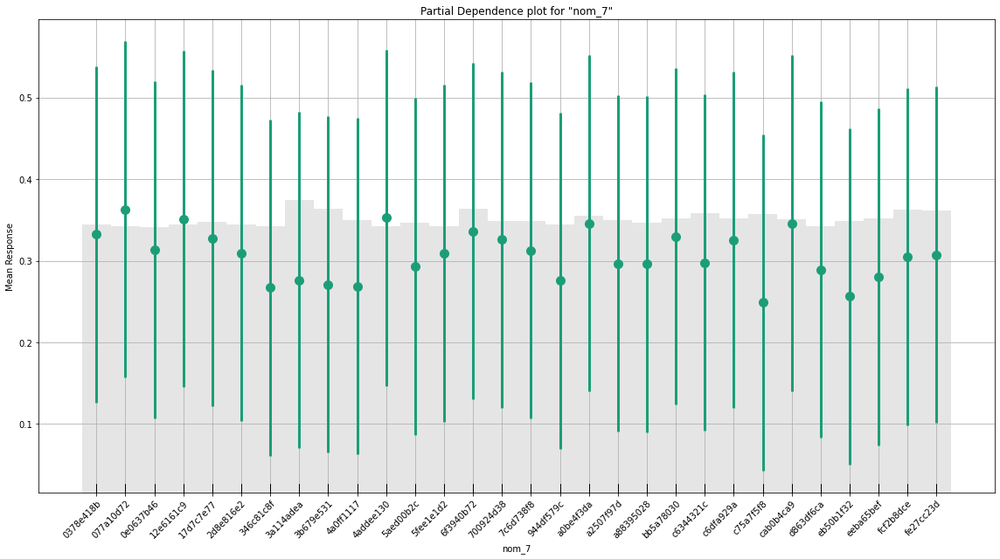

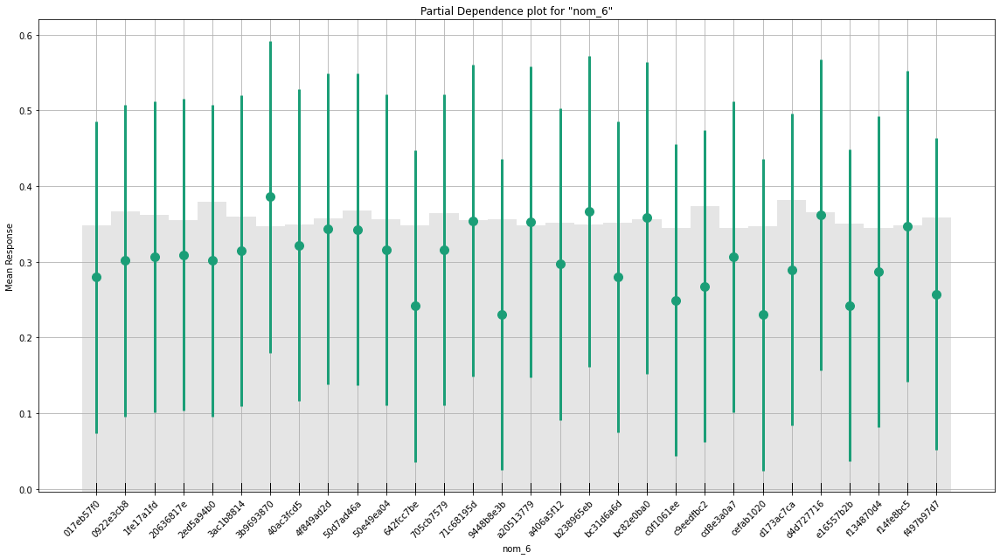

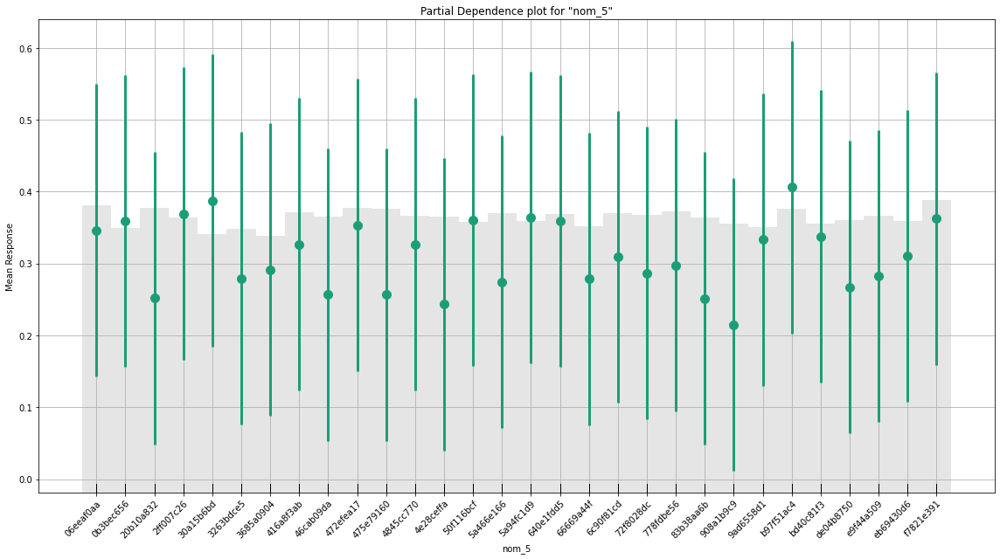

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

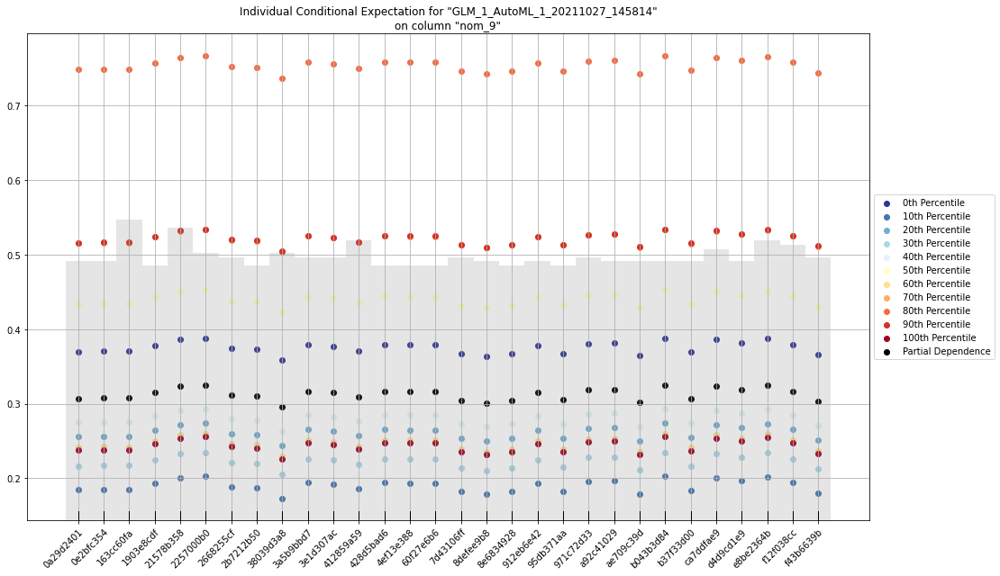

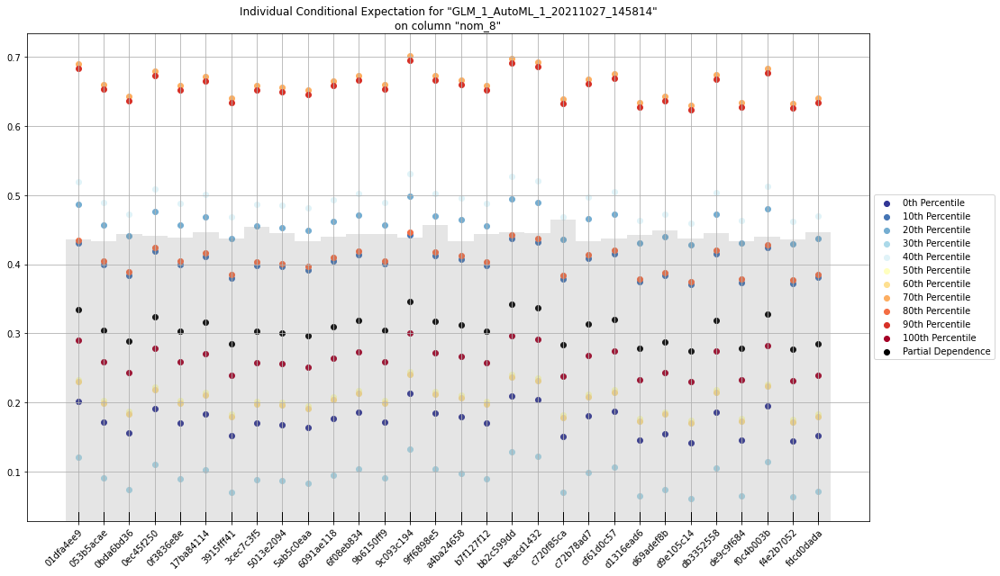

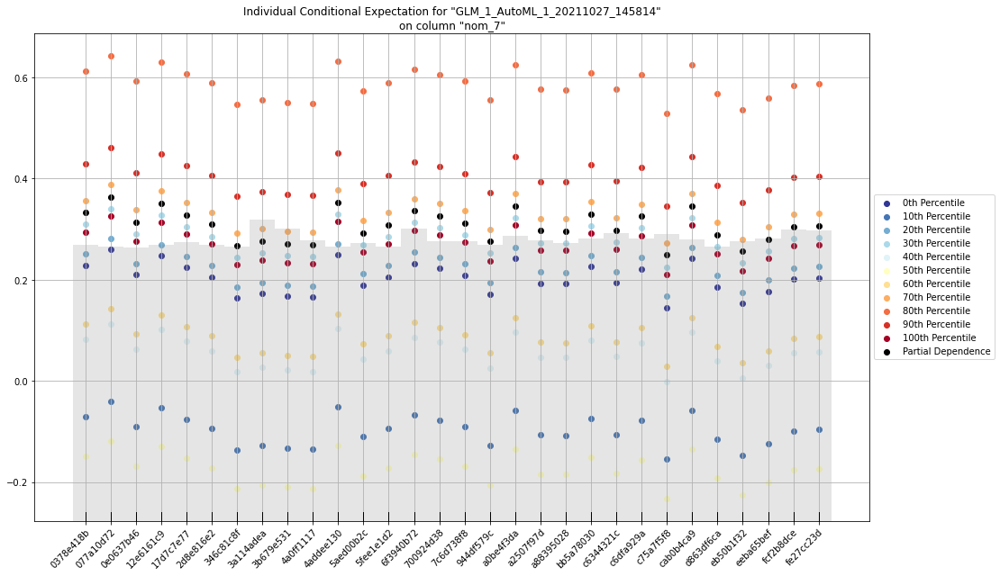

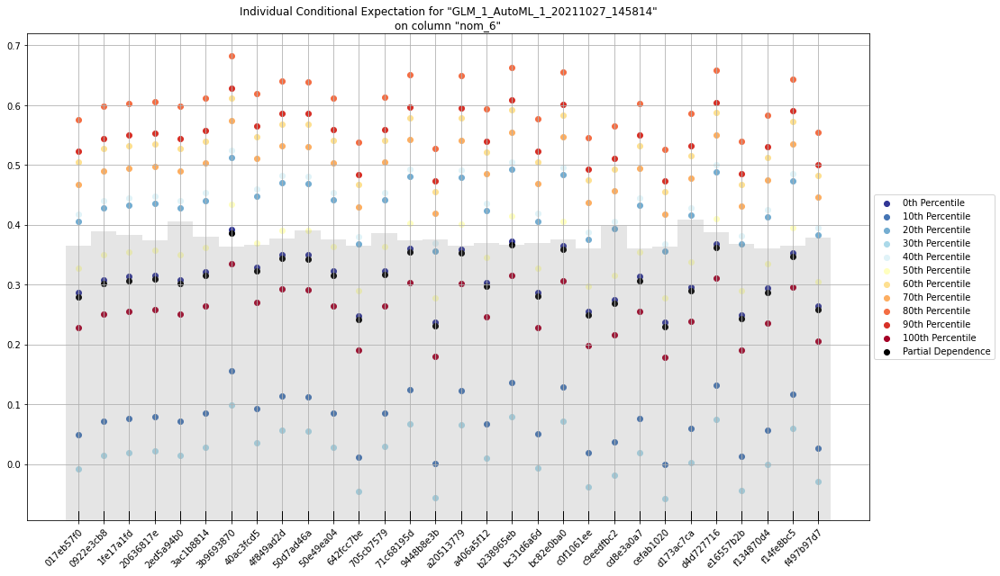

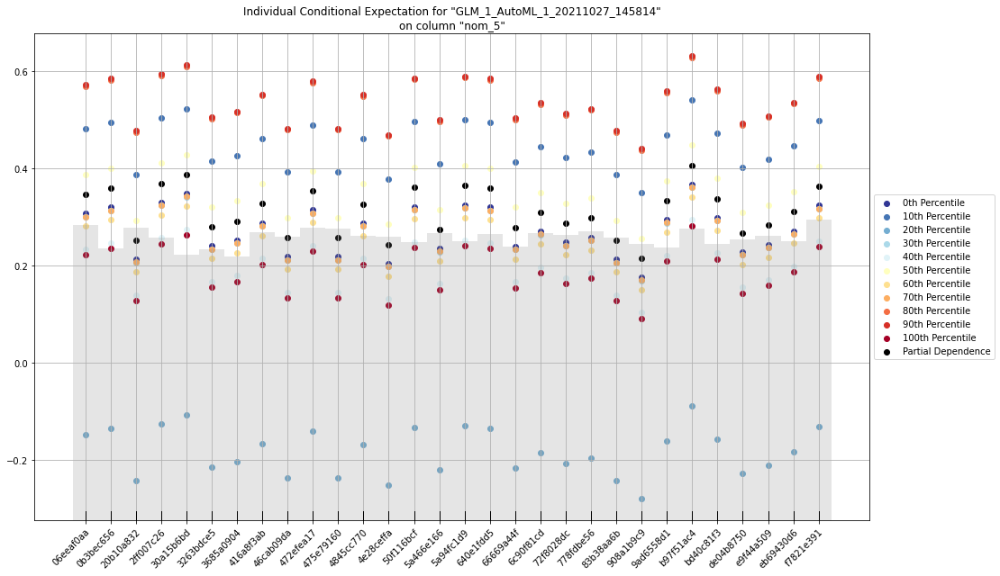

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

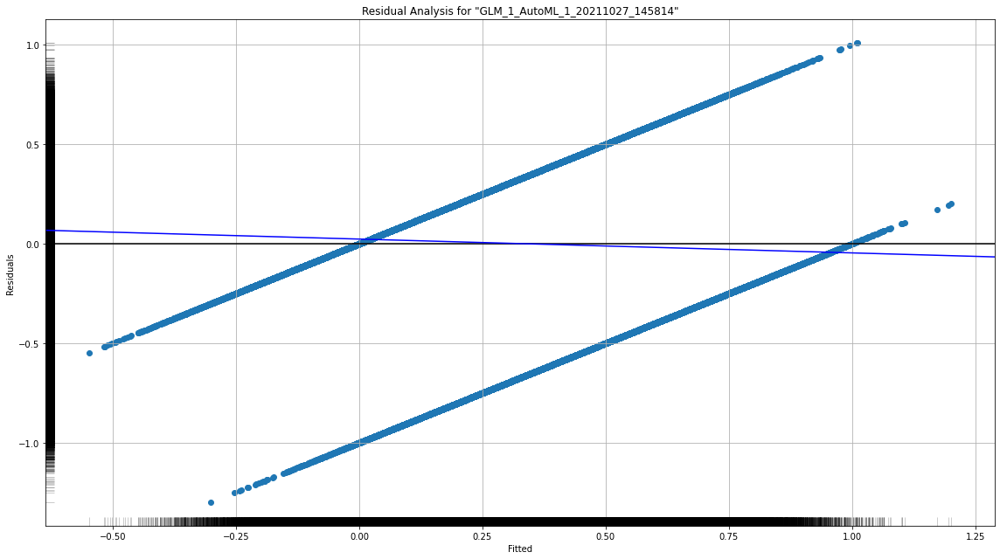

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

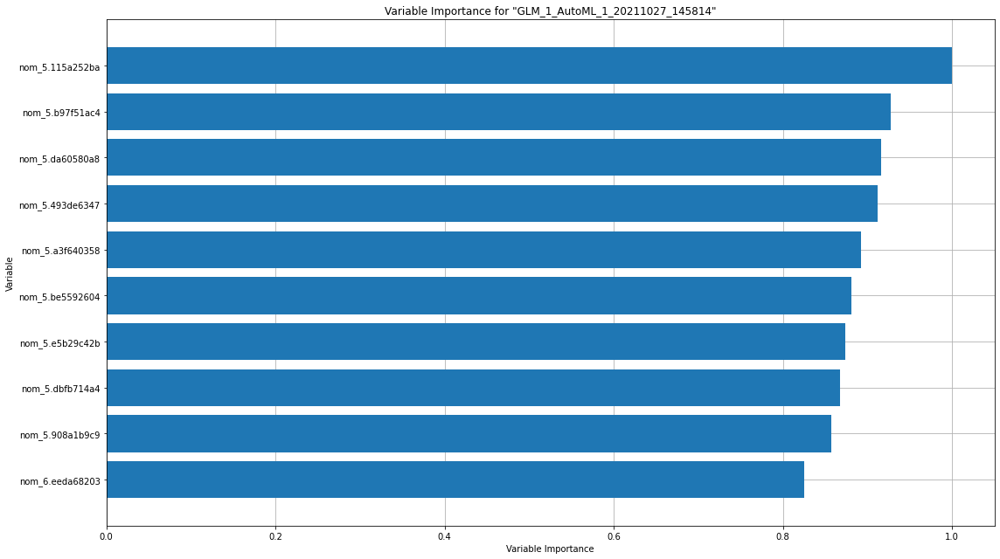

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

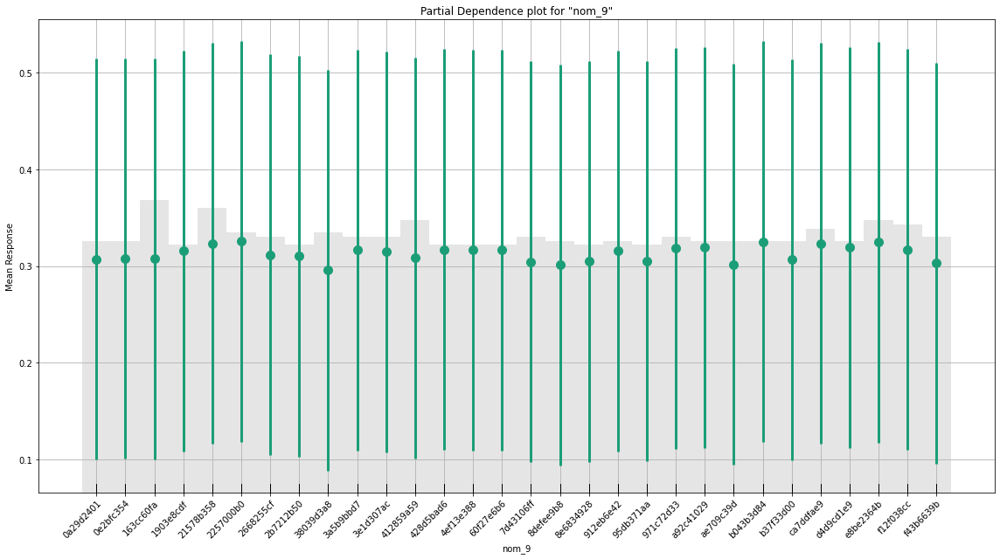

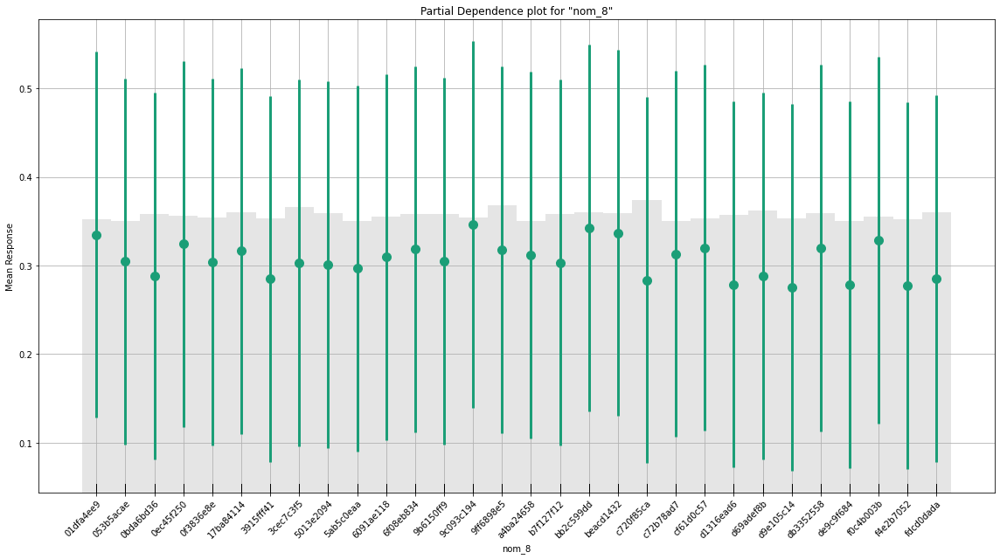

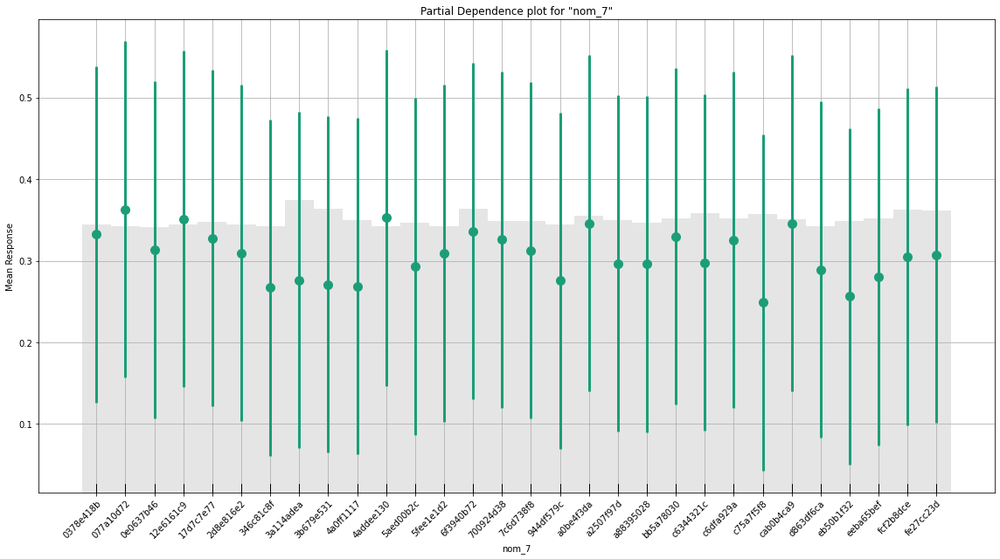

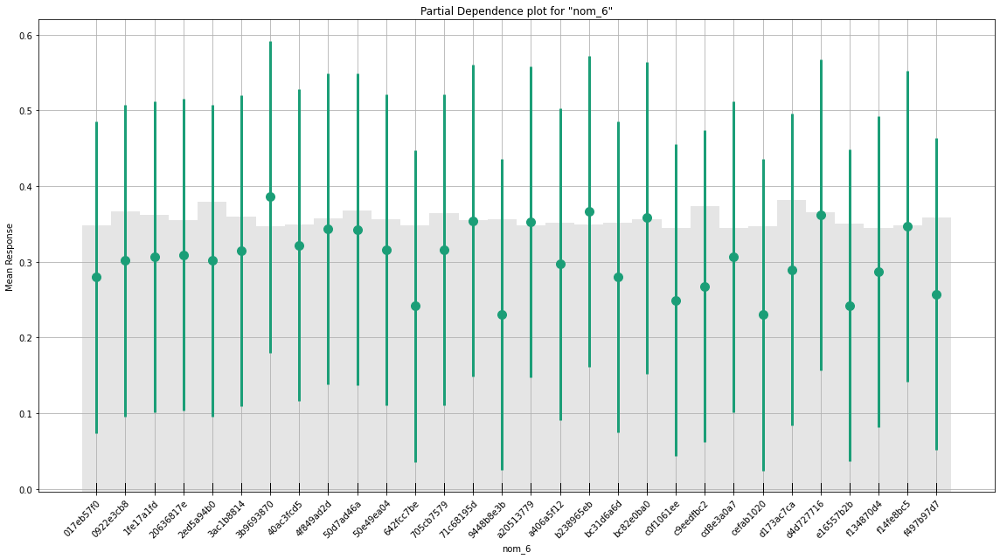

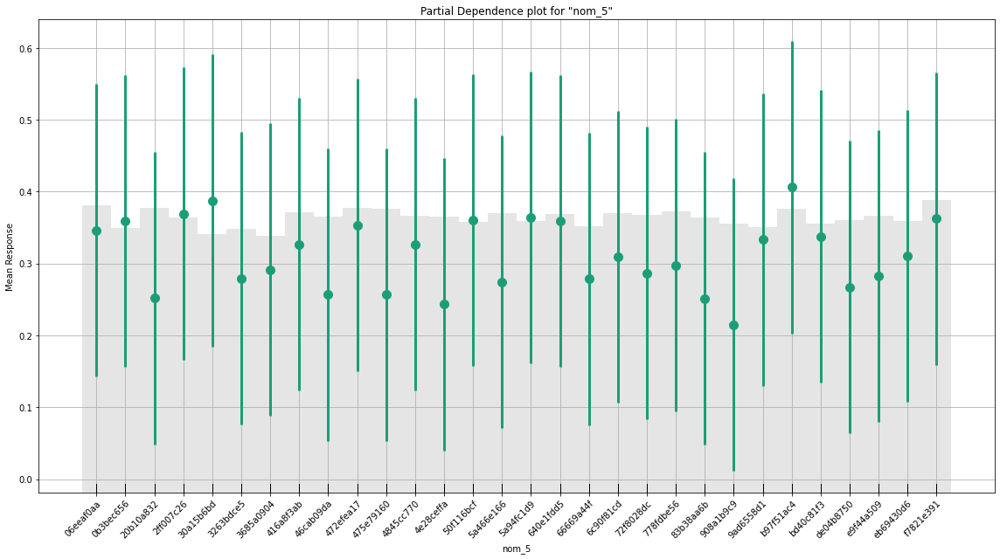

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

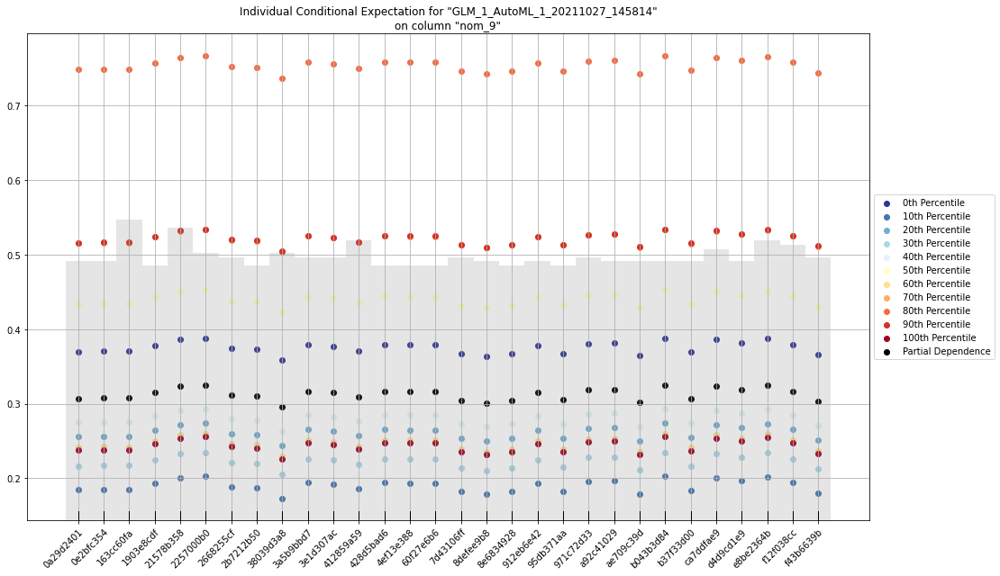

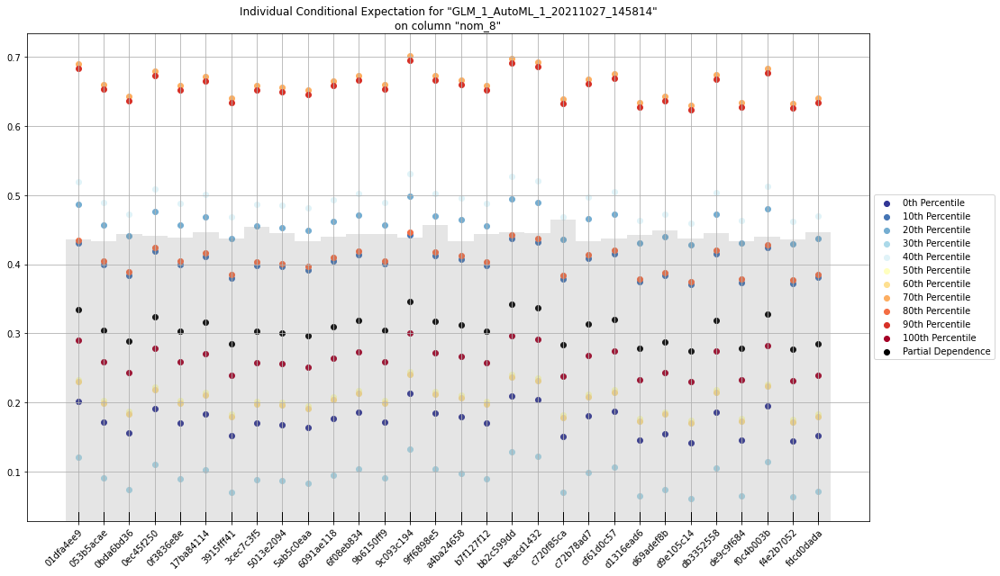

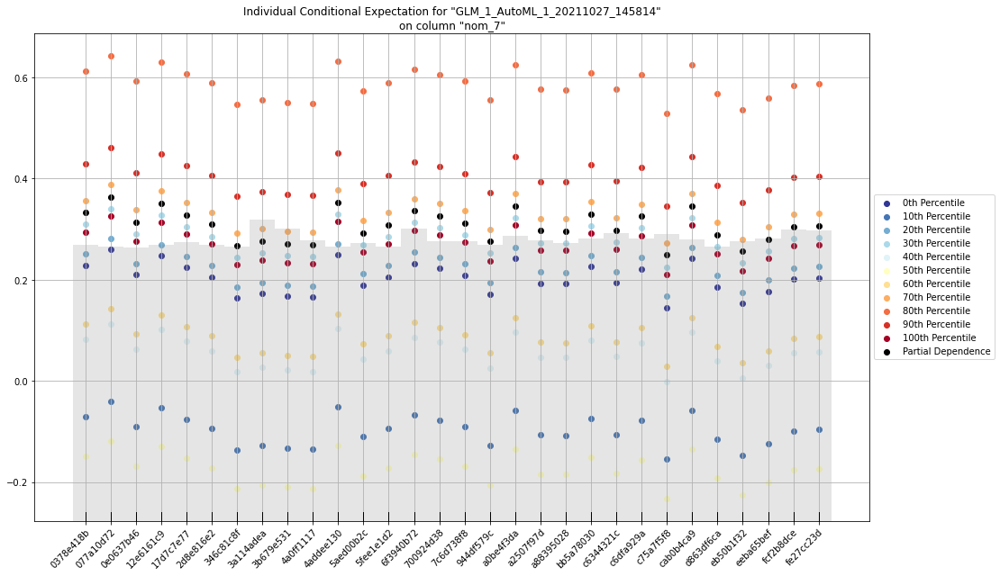

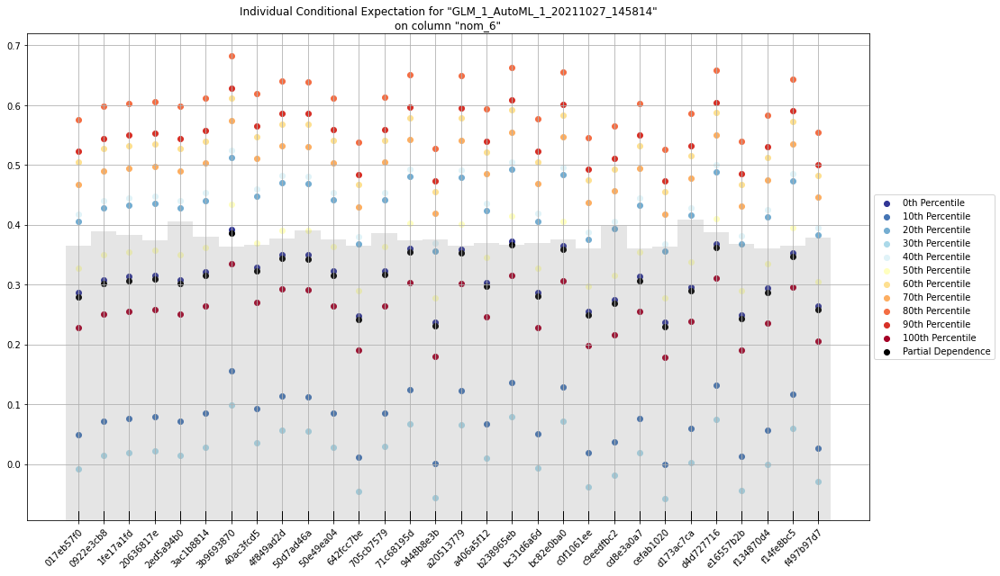

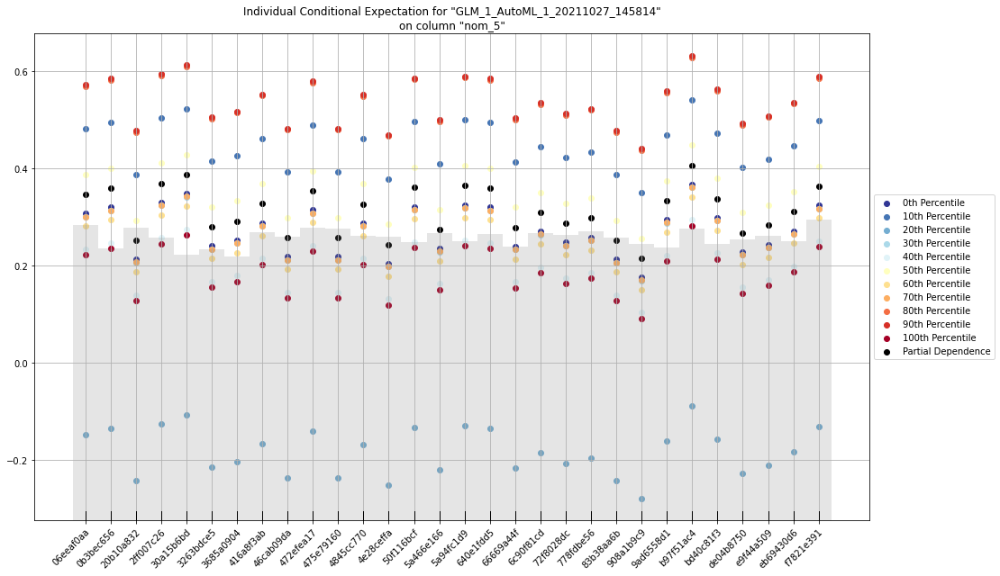

In [ ]:
glm.explain(hf)

## **6. Summary**



---


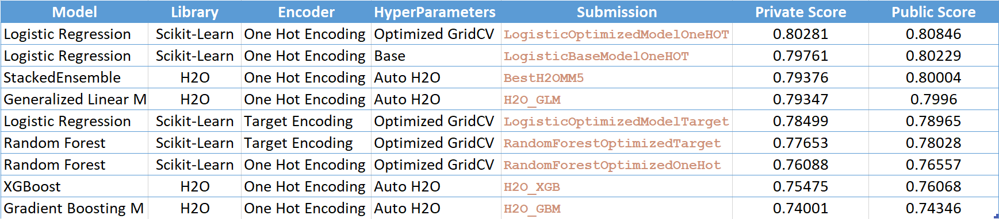



---


I successfully performed ML operations like Data Cleaning, Feature Selection, Feature Engineering, and Compared Trained Models from Scikit-Learn and H2O. From such operaton I found following





> Model Comparison

1.  Scikit-Learn and H2O both did pretty good job on predicting the outcome.  
2.  Hyperparameter tuned Logistic Regression Model from Scikit-Learn produced best result in 9 models we compared.
3. From H2O, Best model was Stacked Ensemble model prdicted outcome with 80% accuracy. And after Ensembles in the leaderboard of H2O Generalized Linear Model predicted output with 79.99% Accuracy
4. From this model comparison it is clear that Linear Models worked well for this classification problem i.e. GLM in H2O and Logistic in the Scikit Learn.

> Feature Engineering

1.   For binnary data we mapped data to 0 and 1 acoordingly.
2.   For ordinal data according to the order number was assigned to each category in the variable.
3.   For nominal data in Logistic Model One Hot Encoding worked well than Target Encoding. However, for Random forest Target encoding performed well.



> Feature Importance



1.   For logistic regression SK-Learn model independent features like "nom_9", "ord_5", "ord_2", "ord_4", "ord_1", "ord_3", "nom_8", "nom_7", "nom_5", "nom_6" are the important features for Classificcation.
2.   For Random Forest "ord_5", "nom_9", "nom_8", "nom_7", "ord_4", "nom_6", "nom_5", "ord_3", "ord_2", "ord_1", "ord_0" are the important features for Classification.


















---


## **7. Competition Score** 





> ### **My best Score**




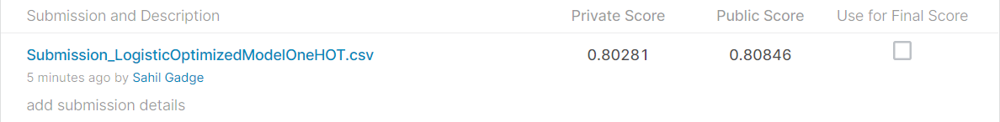



> ### **7.1 Public Score**



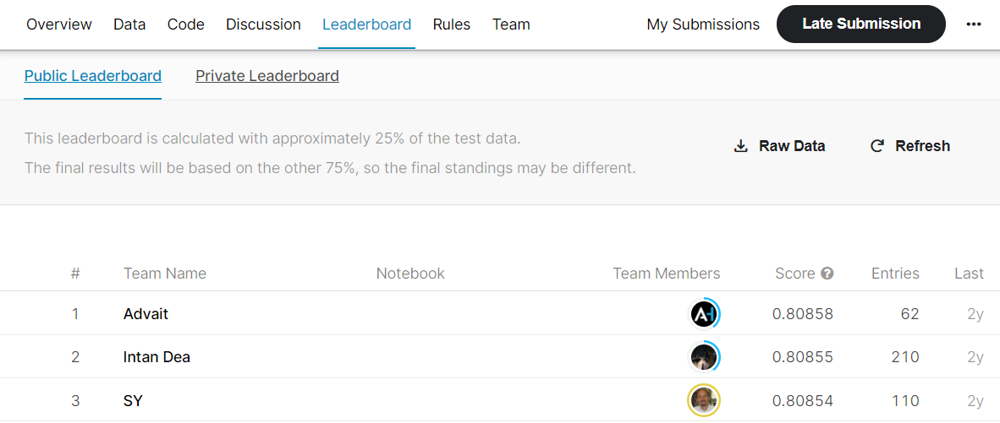



> ### **7.2 Private Score**



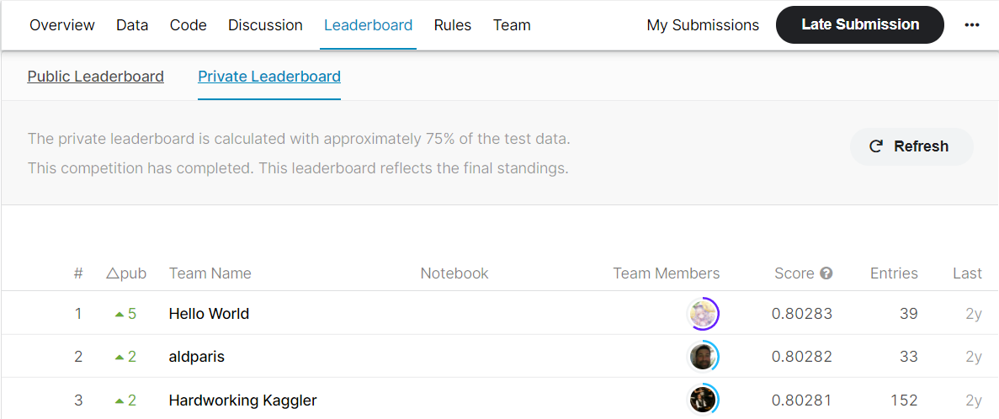

## **8. Contributions Statement** 



---


> JIANGTT's Kaggle Notebook https://www.kaggle.com/jiangtt/lightautoml-0-80599-private-lb

- I learned and understood Categorical Feature Engineering Techniques from this Notebook. Like mapping Binary and Nominal data to respective categories
- I also referred to the logistic regression model he implemented and improved its  models accuracy

> KABURE's Kaggle Notebook https://www.kaggle.com/kabure/eda-feat-engineering-encode-conquer

- This notebook helped me understand data. Graphs plotted in this notebook are inforamtive and easy to understand.
- Categorical Feature Engineering Technique used for Nominal and Day, Month data is very effective and using of sparce matrix to store data is a great solution to store huge data.


> sugawarya's Kaggle Notebook https://www.kaggle.com/sugawarya/h2o-automl-30000sec

- This notebook is gave me basic idea about how to use H2O autoML for this dataset.
- However, by combining Manual encoding for Binary and Ordinal data and Auto encoding for nominal data helped AutoML to give better prediction.




---


## **9. Reference/Citations** 



---





*   H2O AutoML Model- https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html
*   H2O AutoMl Model Explain-https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html
*   SHAP - https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
* SHAP Explained- https://www.kaggle.com/dansbecker/shap-values
* Scikit-Learn Logistic Regression - https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
* Scikit-Learn Random Forest- https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html





---



## **10. Licence**


#### **Copyright>  (Year:-2021) <Name:Sahil Sanjay Gadge>**



---




Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.
